<a href="https://colab.research.google.com/github/Hramchenko/ML/blob/master/conv_aae.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# http://pytorch.org/
from os.path import exists
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

!pip3 install torch torchvision
import torch



In [0]:
print("Device " + torch.cuda.get_device_name(0))
device = torch.device("cuda:0")

Device Tesla K80


In [0]:
from torch.utils.data import DataLoader
from torch.utils.data.sampler import SubsetRandomSampler
from torchvision import datasets, transforms
import matplotlib
import matplotlib.pyplot as plt
import numpy as np

mnist_transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.1307,), (0.3081,)),
           ])

def mnist(batch_size=50, valid=0, shuffle=True, transform=mnist_transform, path='./MNIST_data'):
    test_data = datasets.MNIST(path, train=False, download=True, transform=transform)
    test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False)
    
    train_data = datasets.MNIST(path, train=True, download=True, transform=transform)
    if valid > 0:
        num_train = len(train_data)
        indices = list(range(num_train))
        split = num_train-valid
        np.random.shuffle(indices)

        train_idx, valid_idx = indices[:split], indices[split:]
        train_sampler = SubsetRandomSampler(train_idx)
        valid_sampler = SubsetRandomSampler(valid_idx)

        train_loader = DataLoader(train_data, batch_size=batch_size, sampler=train_sampler)
        valid_loader = DataLoader(train_data, batch_size=batch_size, sampler=valid_sampler)
    
        return train_loader, valid_loader, test_loader
    else:
        train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=shuffle)
        return train_loader, test_loader


def plot_mnist(images, shape, show=True, save_to=None):
    fig = plt.figure(figsize=shape[::-1], dpi=80)
    for j in range(1, len(images) + 1):
        ax = fig.add_subplot(shape[0], shape[1], j)
        ax.matshow(images[j - 1, 0, :, :], cmap = matplotlib.cm.binary)
        plt.xticks(np.array([]))
        plt.yticks(np.array([]))

    if save_to is not None:
        plt.savefig(save_to)
        
    if show:
        plt.show()
    else:
        plt.close()

    
def plot_graphs(log, tpe='loss'):
    keys = log.keys()
    logs = {k:[z for z in zip(*log[k])] for k in keys}
    epochs = {k:range(len(log[k])) for k in keys}
    
    if tpe == 'loss':
        handlers, = zip(*[plt.plot(epochs[k], logs[k][0], label=k) for k in keys])
        plt.title('errors')
        plt.xlabel('epoch')
        plt.ylabel('error')
        plt.legend(handles=handlers)
        plt.show()
    elif tpe == 'accuracy':
        handlers, = zip(*[plt.plot(epochs[k], logs[k][1], label=k) for k in log.keys()])
        plt.title('accuracy')
        plt.xlabel('epoch')
        plt.ylabel('accuracy')
        plt.legend(handles=handlers)
        plt.show()

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms

import numpy as np
import os 

%matplotlib inline

In [0]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [0]:
root_folder = 'Conv_VAE_log_results'
fixed_folder = root_folder + '/Fixed_results'
AE_folder = root_folder + '/AE_results'

if os.path.isdir(root_folder):
    !rm -r $root_folder
os.mkdir(root_folder)
os.mkdir(fixed_folder)
os.mkdir(AE_folder)

In [0]:
mnist_tanh = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize((0.5,), (0.5,)),
           ])

In [0]:
batch_size = 250
batch_zeros = torch.zeros((batch_size, 1)).to(device)
batch_ones = torch.ones((batch_size, 1)).to(device)

In [0]:
beta = 0.1

In [0]:
latent_size = 4

train_loader, valid_loader, test_loader = mnist(batch_size=batch_size, valid=10000, transform=mnist_tanh)
fixed_z = torch.randn((50, latent_size))
fixed_data, _ = next(iter(test_loader))
fixed_data = fixed_data[0:50]

In [0]:
class ConvLayer(nn.Module):
    def __init__(self, size, padding=1, pool_layer=nn.MaxPool2d(2, stride=2),
                 bn=False, dropout=False, activation_fn=nn.ReLU(), stride=1):
        super(ConvLayer, self).__init__()
        layers = []
        layers.append(nn.Conv2d(size[0], size[1], size[2], padding=padding, stride=stride))
        if pool_layer is not None:
            layers.append(pool_layer)
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [0]:
class DeconvLayer(nn.Module):
    def __init__(self, size, padding=1, stride=1, 
                 bn=False, dropout=False, activation_fn=nn.ReLU(), output_padding=0):
        super(DeconvLayer, self).__init__()
        layers = []
        layers.append(nn.ConvTranspose2d(size[0], size[1], size[2], padding=padding, 
                                         stride=stride, output_padding=output_padding))
        if bn:
            layers.append(nn.BatchNorm2d(size[1]))
        if dropout:
            layers.append(nn.Dropout2d())
        layers.append(activation_fn)
        
        self.model = nn.Sequential(*layers)
    
    def forward(self, x):
        return self.model(x)

In [0]:
class FullyConnected(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh):
        super(FullyConnected, self).__init__()
        layers = []
        
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout())
            layers.append(activation_fn())
        else: # нам не нужен дропаут и фнкция активации в последнем слое
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        return self.model(x)

In [0]:
class Net(nn.Module):
    def __init__(self, latent_size=32, gamma=1e-3, batchnorm=False, dropout=False, optim_type='SGD', **optim_params):
        super(Net, self).__init__()
    
        self.latent_size = latent_size
        self.gamma = gamma
        
        self._conv1 = ConvLayer([1, 16, 4], padding=0, bn=batchnorm, stride=2, pool_layer=None)
        self._conv2 = ConvLayer([16, 32, 4], padding=0, bn=batchnorm, stride=2, pool_layer=None)
        self._conv3 = ConvLayer([32, 32, 3], padding=0, bn=batchnorm, stride=2, pool_layer=None)
            
        self.fce = FullyConnected([32*2*2, latent_size])
        self.fcd = FullyConnected([latent_size, 32*2*2])
        
        self._deconv1 = DeconvLayer([32, 32, 3], stride=2, padding=0, bn=batchnorm)
        self._deconv2 = DeconvLayer([32, 16, 4], stride=2, padding=0, bn=batchnorm, output_padding=1)
        self._deconv3 = DeconvLayer([16, 1, 4], stride=2, padding=0, bn=batchnorm, activation_fn=nn.Tanh())
        
        self._loss = None
        if optim_type == 'SGD':
            self.optim = optim.SGD(self.parameters(), **optim_params)
        elif optim_type == 'Adadelta':
            self.optim = optim.Adadelta(self.parameters(), **optim_params)
        elif optim_type == 'RMSProp':
            self.optim = optim.RMSprop(self.parameters(), **optim_params)
        elif optim_type == 'Adam':
            self.optim = optim.Adam(self.parameters(), **optim_params)
        
    def conv(self, x):
        l1 = self._conv1(x)
        l2 = self._conv2(l1)
        l3 = self._conv3(l2)
        return l3, l2, l1
    
    def encode(self, x):
        l3 = self.conv(x)[0]
        flatten = l3.view(-1, 32*2*2)
        h = self.fce(flatten)
        return h
    
    def decode(self, h):
        flatten = self.fcd(h)
        l1 = flatten.view(-1, 32, 2, 2)
        l2 = self._deconv1(l1)
        l3 = self._deconv2(l2)
        x = self._deconv3(l3)
        return x
    
    def forward(self, x):
        h = self.encode(x)
        self.enc = h
        r = self.decode(h)
        return r
    
    def _sample(self, n):
        return torch.randn([n, self.latent_size]).to(device)
    
    def loss(self, output, target, size_average=True):
        self._loss = F.mse_loss(output, target)
        return self._loss
        
        
        KLD = self.mu**2 + self.logvar.exp() - 1 - self.logvar
        KLD = 0.5*KLD.sum(1)
        if size_average:
            self.KLD = KLD.mean()
            self._loss = F.mse_loss(output, target, reduction='mean')
        else:
            self.KLD = KLD.sum()
            self._loss = F.mse_loss(output, target, reduction='sum')
        
        return self._loss + self.gamma*self.KLD

In [0]:

model = Net(latent_size, 0.005, batchnorm=True, dropout=False, optim_type='Adam', lr=1e-4).to(device)
#train_log = {k: [] for k in models}
#test_log = {k: [] for k in models}

In [0]:
class FullyConnectedA(nn.Module):
    def __init__(self, sizes, dropout=False, activation_fn=nn.Tanh(), flatten=False, last_fn=None):
        super(FullyConnectedA, self).__init__()
        layers = []
        self.flatten = flatten
        for i in range(len(sizes) - 2):
            layers.append(nn.Linear(sizes[i], sizes[i+1]))
            if dropout:
                layers.append(nn.Dropout(dropout))
            layers.append(activation_fn) # нам не нужен дропаут и фнкция активации в последнем слое
        else: 
            layers.append(nn.Linear(sizes[-2], sizes[-1]))
        if last_fn is not None:
            layers.append(last_fn)
        self.model = nn.Sequential(*layers)
        
    def forward(self, x):
        if self.flatten:
            x = x.view(x.shape[0], -1)
        return self.model(x)

In [0]:
D = FullyConnectedA([latent_size, 1024, 512, 256, 1], dropout=0.3, activation_fn=nn.LeakyReLU(0.3)).to(device)
D_optimizer = optim.Adam(D.parameters(), lr=1e-4)

def sample(latent_size, n):
  return torch.randn([n, latent_size], ).to(device)

D(sample(latent_size, 10))



tensor([[-0.0295],
        [-0.1418],
        [ 0.0319],
        [-0.1054],
        [ 0.0104],
        [-0.0526],
        [ 0.0135],
        [-0.1778],
        [-0.1576],
        [ 0.0566]], device='cuda:0', grad_fn=<AddmmBackward>)

In [0]:
def train(epoch, model, log=None):
    train_size = len(train_loader.sampler)
    for batch_idx, (data, _) in enumerate(train_loader):
        data = data.to(device)
      
        D.zero_grad()
        model.optim.zero_grad()
        
        z = torch.randn((batch_size, latent_size))
        
        enc = model.encode(data)
        fake_pred = D(enc)
        true_pred = D(z.to(device))
        
        fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
        true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
        
        D_loss = 0.5*(fake_loss + true_loss)
        
        D_loss.backward()
        D_optimizer.step()
      
      
        D.zero_grad()
        model.optim.zero_grad()
      
        output = model(data)
        fake_pred = D(model.enc)
        G_loss = model.loss(output, data) + beta*F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
        G_loss.backward()
        model.optim.step()
        D_optimizer.step()
           
        if batch_idx % 100 == 0:
            line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
                epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
            losses = 'G: {:.4f}, D: {:.4f}'.format(G_loss.item(), D_loss.item())
            print(line + losses)
            
#     else:
#         batch_idx += 1
#         line = 'Train Epoch: {} [{}/{} ({:.0f}%)]\tLosses '.format(
#             epoch, batch_idx * len(data), train_size, 100. * batch_idx / len(train_loader))
#         losses = ' '.join(['{}: {:.4f}'.format(k, m._loss.item()) for k, m in models.items()])
#         if log is not None:
#             for k in models:
#                 log[k].append((models[k]._loss,))
#         print(line + losses)

In [0]:
def test(model, D, loader, epoch, log=None):
    test_size = len(loader)
    G_loss = 0.
    D_loss = 0.
    test_loss = {'G': 0., 'D': 0.}
    Enc_loss = 0
    Distr_loss = 0
    with torch.no_grad():
        for data, _ in loader:
          data = data.to(device)
          z = torch.randn((batch_size, latent_size))
        
          enc = model.encode(data)
          fake_pred = D(enc)
          true_pred = D(z.to(device))
        
          fake_loss = F.binary_cross_entropy_with_logits(fake_pred, batch_zeros)
          true_loss = F.binary_cross_entropy_with_logits(true_pred, batch_ones)
        
          D_loss += 0.5*(fake_loss + true_loss)
      
          output = model(data)
          fake_pred = D(model.enc)
          el = model.loss(output, data) 
          Enc_loss += el
          dl = beta*F.binary_cross_entropy_with_logits(fake_pred, batch_ones)
          Distr_loss += dl
          G_loss += el + dl

    G_loss /= test_size
    D_loss /= test_size
    report = 'Test losses. G: {:.4f}, D: {:.4f}'.format(G_loss, D_loss)
    ae_data = model(fixed_data.to(device)).data.cpu().numpy()
    fixed_gen = model.decode(fixed_z.to(device)).data.cpu().numpy()
    print("Original:")
    plot_mnist(fixed_data, (5, 10), True, AE_folder + '/%s_%03d.png' % (0, epoch))
    print("Encoded")
    plot_mnist(ae_data, (5, 10), True, AE_folder + '/%s_%03d.png' % (0, epoch))
    print("Generated")
    plot_mnist(fixed_gen, (5, 10), True, fixed_folder + '/%s_%03d.png' % (0, epoch))     
    print(report) 
    w = Distr_loss/(Enc_loss+Distr_loss)
    print("Distribution error weight: " + str(w.item()))


Original:


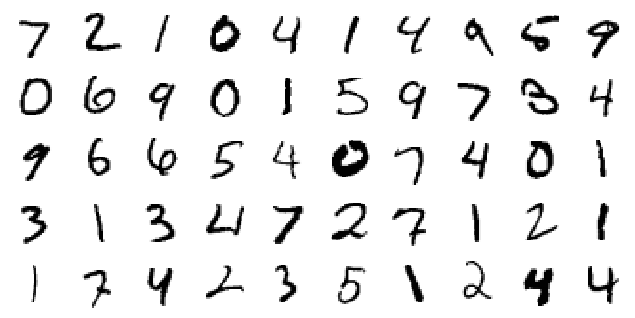

Encoded


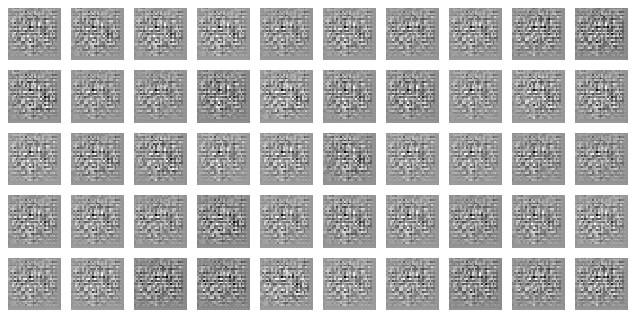

Generated


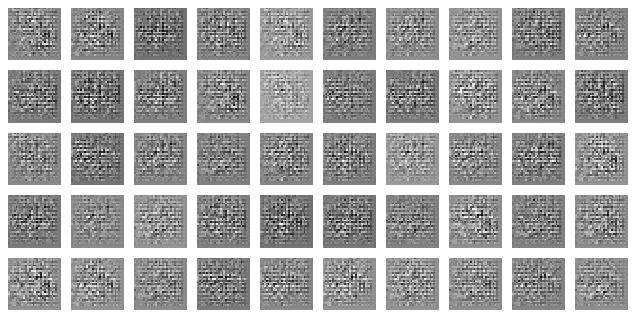

Test losses. G: 1.0104, D: 0.6970
Distribution error weight: 0.06907331943511963


In [0]:
test(model, D, test_loader, 1)

Train Epoch: 1 [0/50000 (0%)]	Losses G: 1.0113, D: 0.6997
Train Epoch: 1 [25000/50000 (50%)]	Losses G: 0.9818, D: 0.4102
Original:


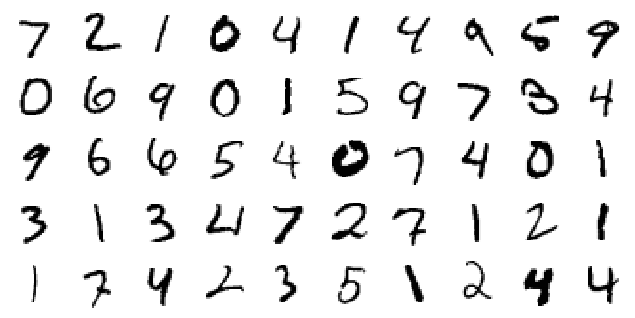

Encoded


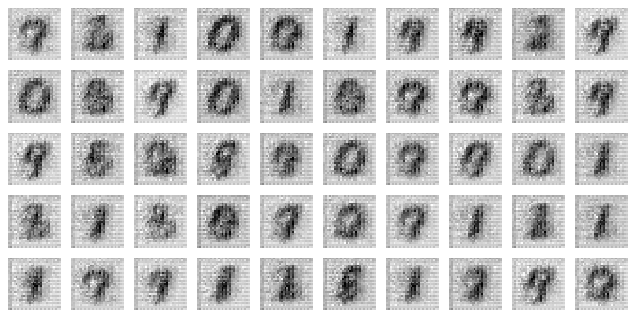

Generated


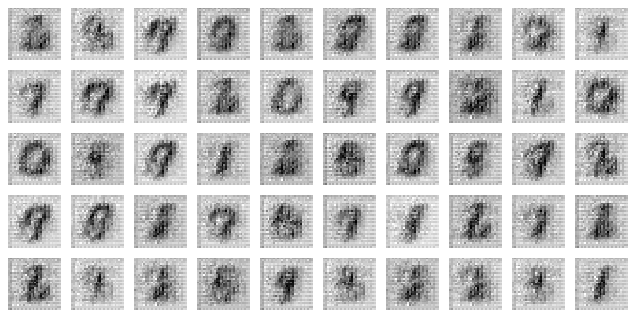

Test losses. G: 0.8908, D: 0.6140
Distribution error weight: 0.08723318576812744
Train Epoch: 2 [0/50000 (0%)]	Losses G: 0.8940, D: 0.6115
Train Epoch: 2 [25000/50000 (50%)]	Losses G: 0.8450, D: 0.6657
Original:


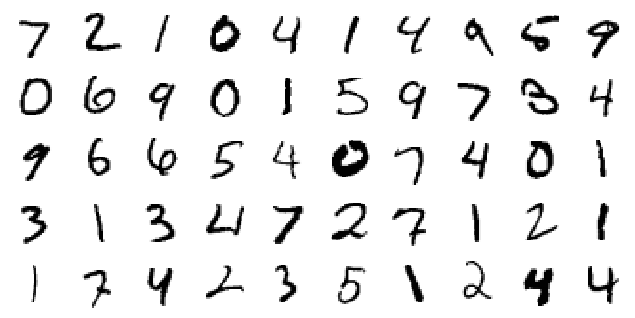

Encoded


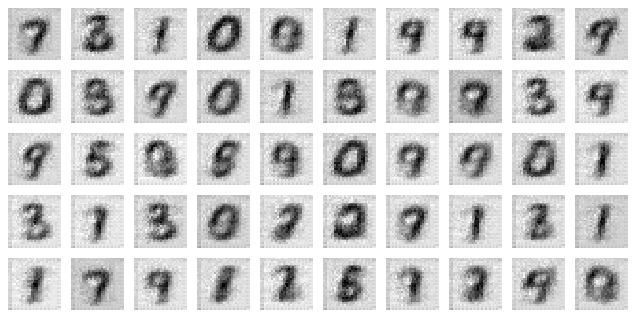

Generated


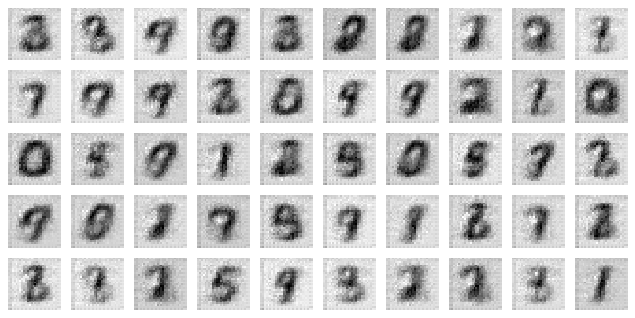

Test losses. G: 0.8175, D: 0.6763
Distribution error weight: 0.0784657672047615
Train Epoch: 3 [0/50000 (0%)]	Losses G: 0.8213, D: 0.6800
Train Epoch: 3 [25000/50000 (50%)]	Losses G: 0.7952, D: 0.6866
Original:


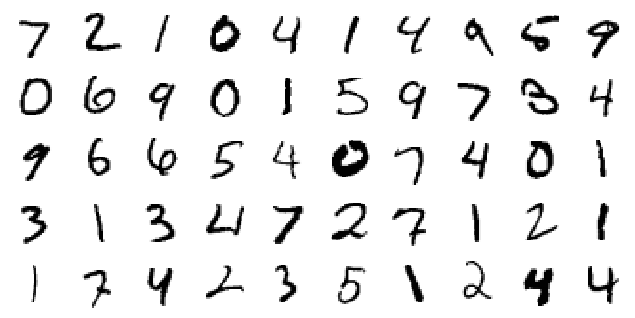

Encoded


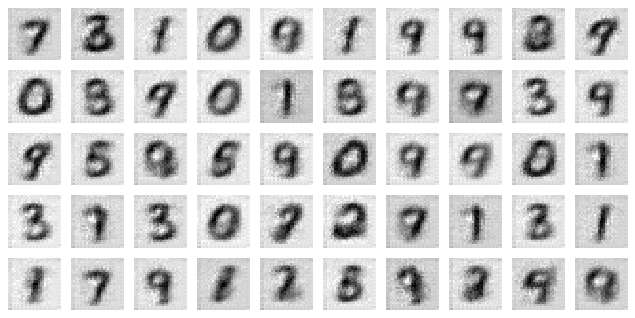

Generated


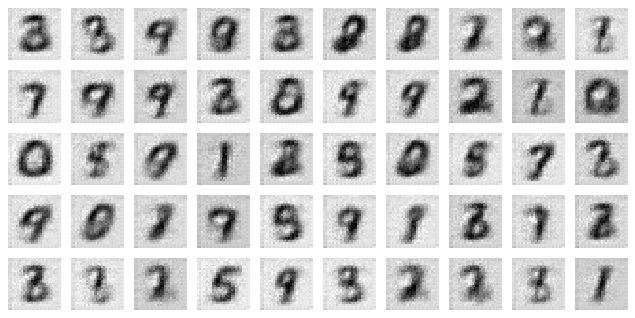

Test losses. G: 0.7719, D: 0.6884
Distribution error weight: 0.08118478953838348
Train Epoch: 4 [0/50000 (0%)]	Losses G: 0.7764, D: 0.6970
Train Epoch: 4 [25000/50000 (50%)]	Losses G: 0.7503, D: 0.6855
Original:


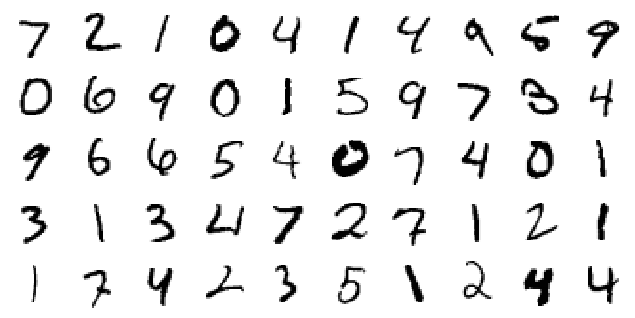

Encoded


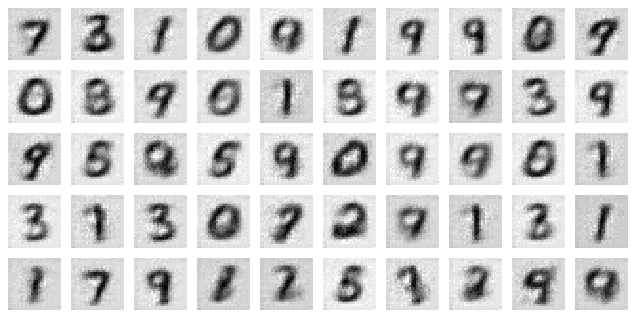

Generated


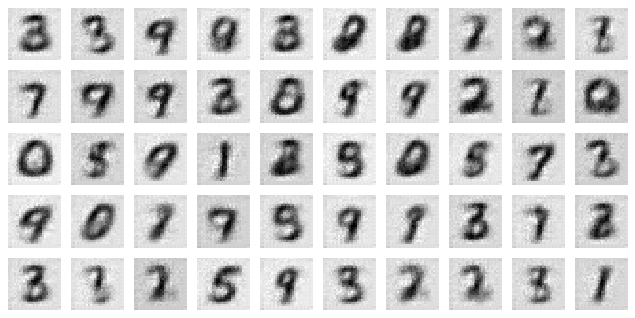

Test losses. G: 0.7322, D: 0.6882
Distribution error weight: 0.085192009806633
Train Epoch: 5 [0/50000 (0%)]	Losses G: 0.7318, D: 0.6890
Train Epoch: 5 [25000/50000 (50%)]	Losses G: 0.7157, D: 0.6932
Original:


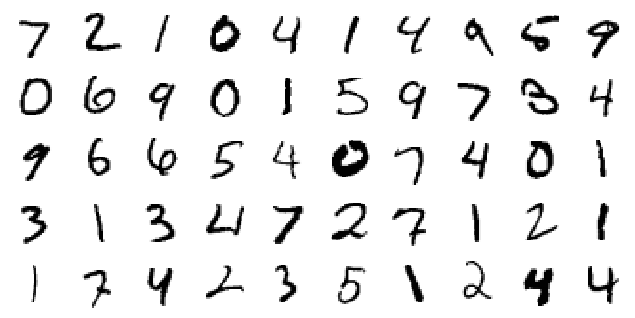

Encoded


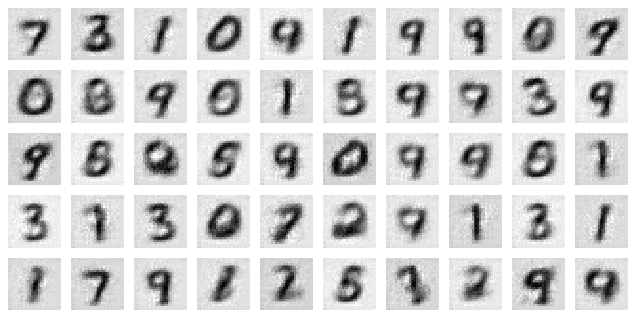

Generated


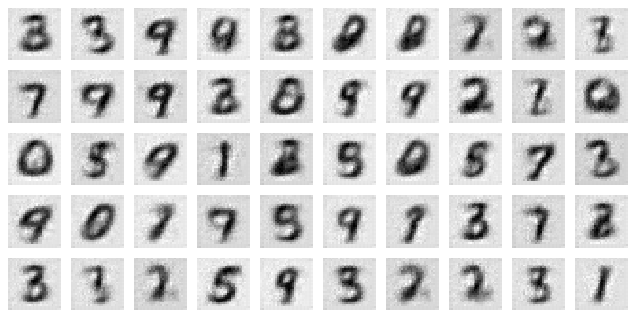

Test losses. G: 0.6962, D: 0.6906
Distribution error weight: 0.08905349671840668
Train Epoch: 6 [0/50000 (0%)]	Losses G: 0.6953, D: 0.6817
Train Epoch: 6 [25000/50000 (50%)]	Losses G: 0.6858, D: 0.6814
Original:


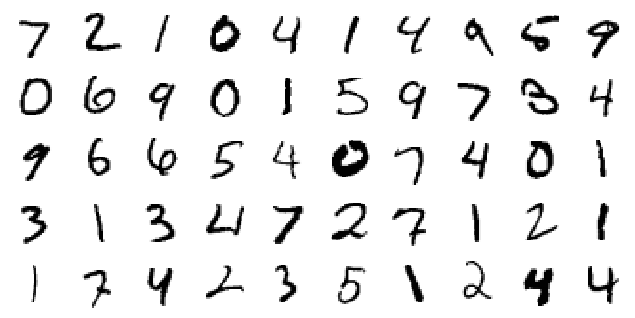

Encoded


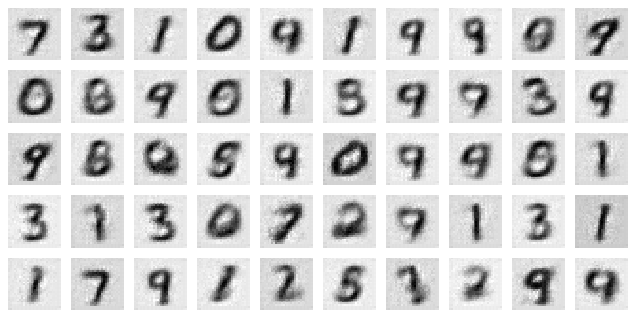

Generated


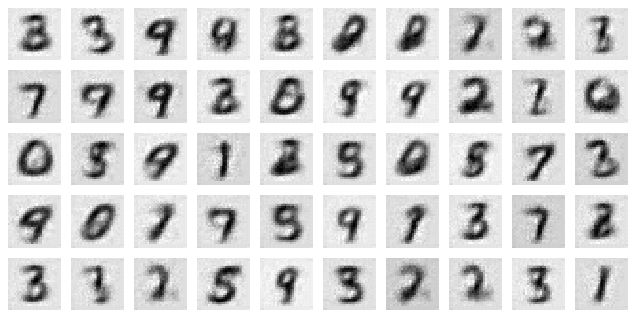

Test losses. G: 0.6640, D: 0.6869
Distribution error weight: 0.09488162398338318
Train Epoch: 7 [0/50000 (0%)]	Losses G: 0.6629, D: 0.6856
Train Epoch: 7 [25000/50000 (50%)]	Losses G: 0.6520, D: 0.6939
Original:


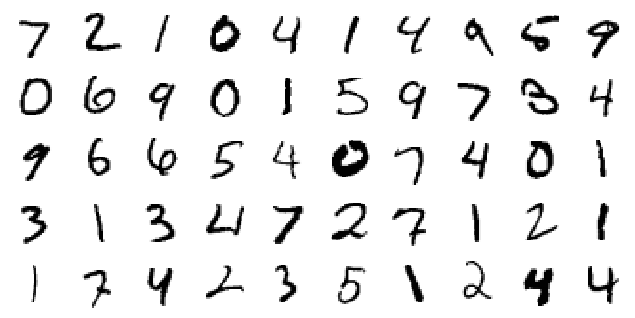

Encoded


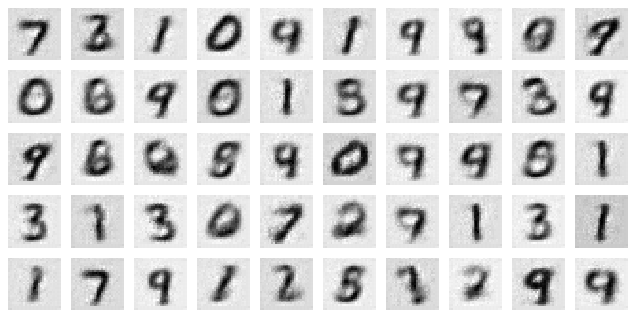

Generated


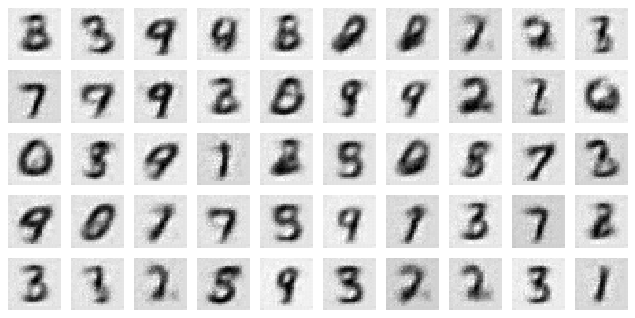

Test losses. G: 0.6327, D: 0.6888
Distribution error weight: 0.09852653741836548
Train Epoch: 8 [0/50000 (0%)]	Losses G: 0.6296, D: 0.6929
Train Epoch: 8 [25000/50000 (50%)]	Losses G: 0.6183, D: 0.6855
Original:


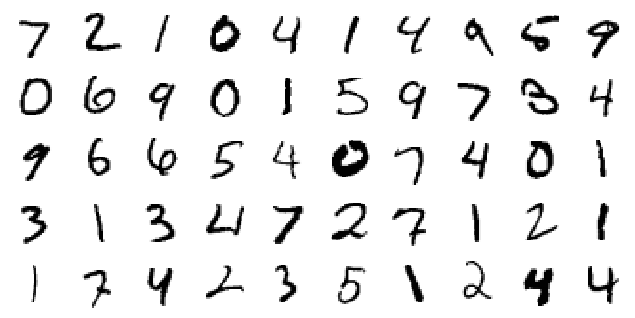

Encoded


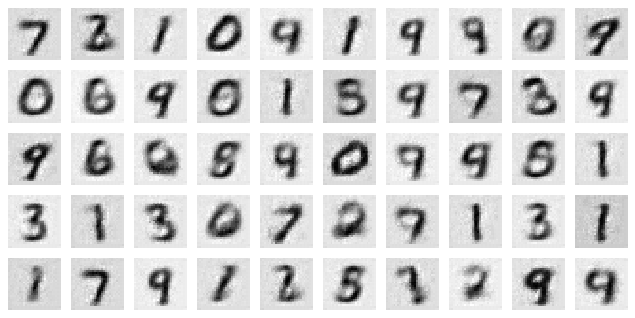

Generated


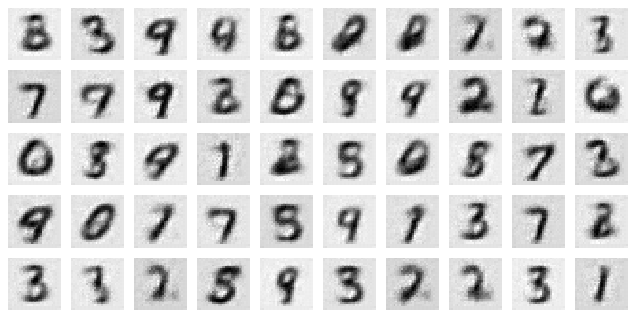

Test losses. G: 0.6048, D: 0.6886
Distribution error weight: 0.10410646349191666
Train Epoch: 9 [0/50000 (0%)]	Losses G: 0.6004, D: 0.6881
Train Epoch: 9 [25000/50000 (50%)]	Losses G: 0.5959, D: 0.6887
Original:


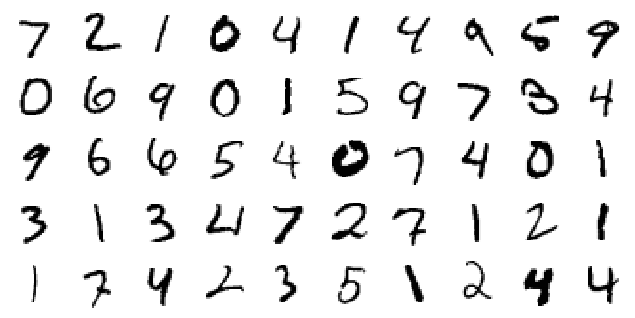

Encoded


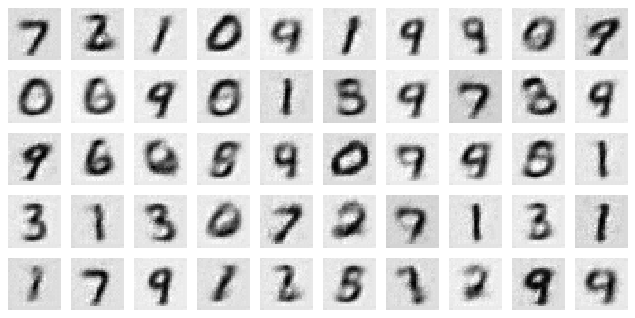

Generated


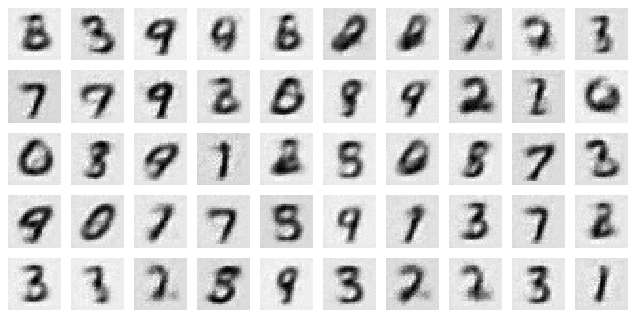

Test losses. G: 0.5779, D: 0.6889
Distribution error weight: 0.10811126232147217
Train Epoch: 10 [0/50000 (0%)]	Losses G: 0.5787, D: 0.6925
Train Epoch: 10 [25000/50000 (50%)]	Losses G: 0.5621, D: 0.6884
Original:


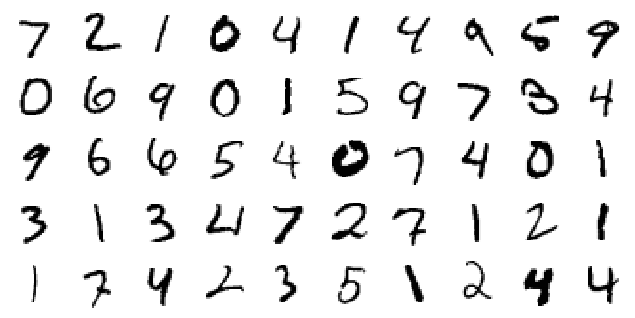

Encoded


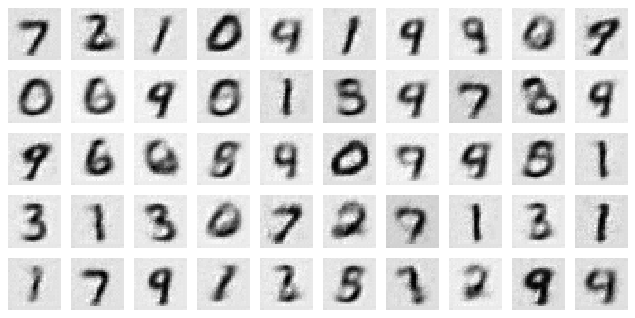

Generated


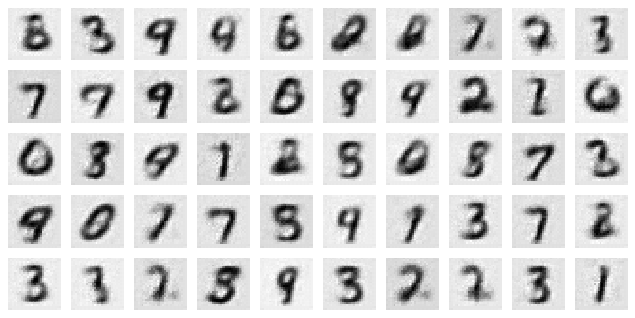

Test losses. G: 0.5527, D: 0.6885
Distribution error weight: 0.1121816486120224
Train Epoch: 11 [0/50000 (0%)]	Losses G: 0.5509, D: 0.6800
Train Epoch: 11 [25000/50000 (50%)]	Losses G: 0.5404, D: 0.6896
Original:


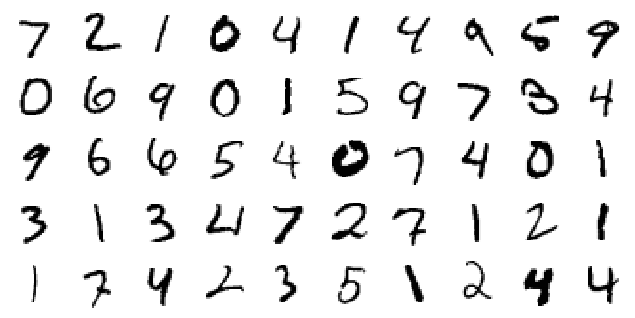

Encoded


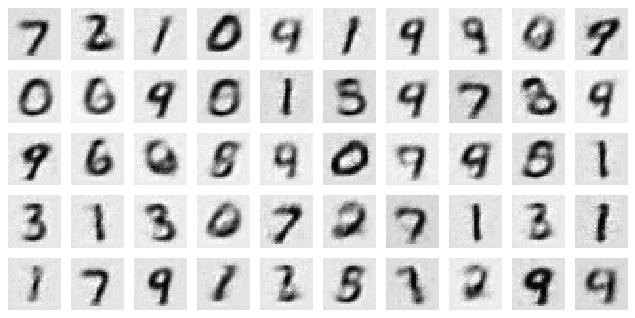

Generated


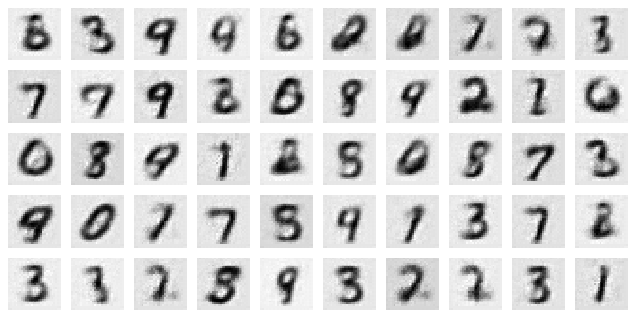

Test losses. G: 0.5299, D: 0.6882
Distribution error weight: 0.11712651699781418
Train Epoch: 12 [0/50000 (0%)]	Losses G: 0.5277, D: 0.6865
Train Epoch: 12 [25000/50000 (50%)]	Losses G: 0.5210, D: 0.6947
Original:


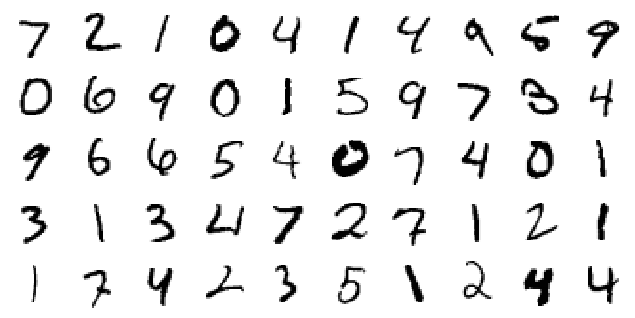

Encoded


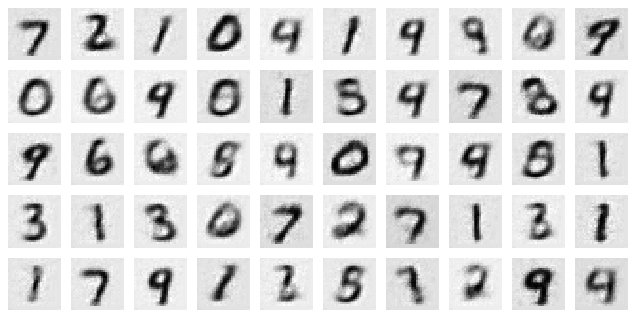

Generated


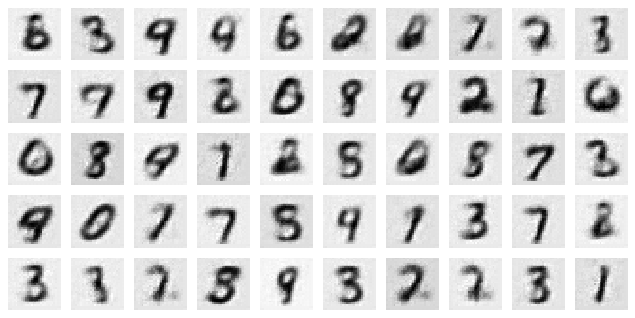

Test losses. G: 0.5085, D: 0.6888
Distribution error weight: 0.12200500071048737
Train Epoch: 13 [0/50000 (0%)]	Losses G: 0.5095, D: 0.6869
Train Epoch: 13 [25000/50000 (50%)]	Losses G: 0.4938, D: 0.6899
Original:


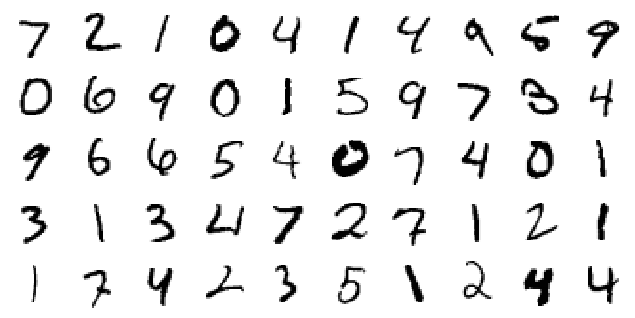

Encoded


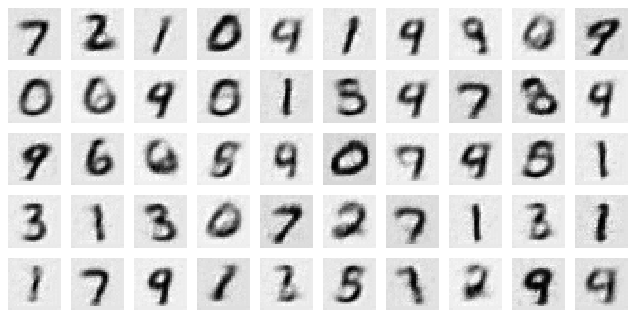

Generated


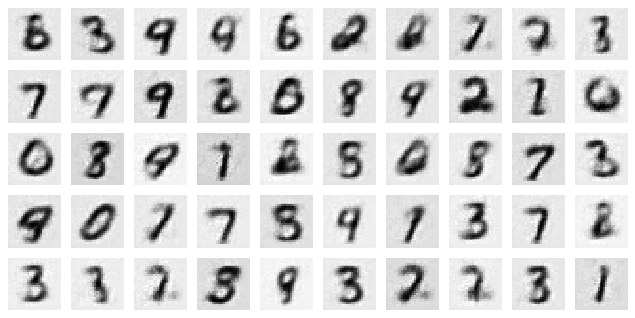

Test losses. G: 0.4888, D: 0.6893
Distribution error weight: 0.12789225578308105
Train Epoch: 14 [0/50000 (0%)]	Losses G: 0.4919, D: 0.6861
Train Epoch: 14 [25000/50000 (50%)]	Losses G: 0.4781, D: 0.6909
Original:


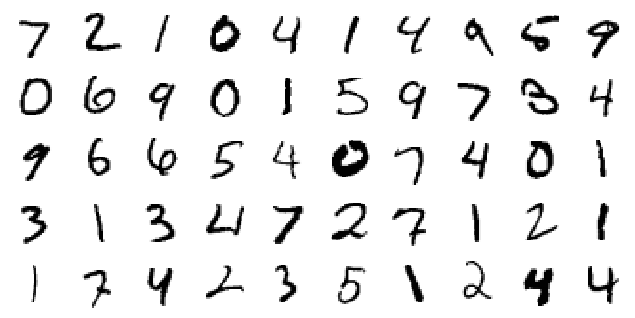

Encoded


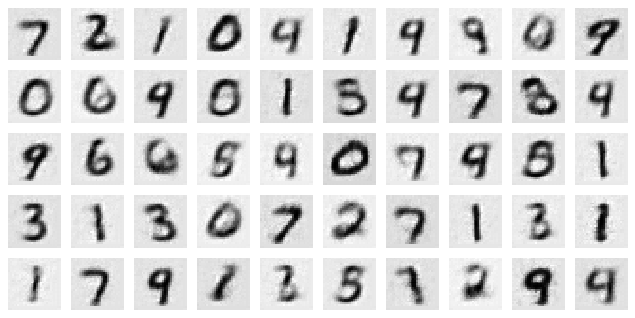

Generated


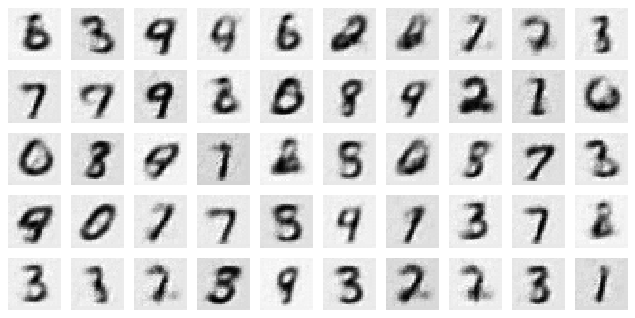

Test losses. G: 0.4707, D: 0.6886
Distribution error weight: 0.13382475078105927
Train Epoch: 15 [0/50000 (0%)]	Losses G: 0.4722, D: 0.6873
Train Epoch: 15 [25000/50000 (50%)]	Losses G: 0.4602, D: 0.6857
Original:


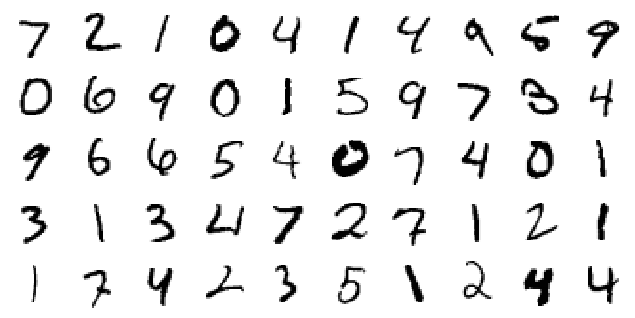

Encoded


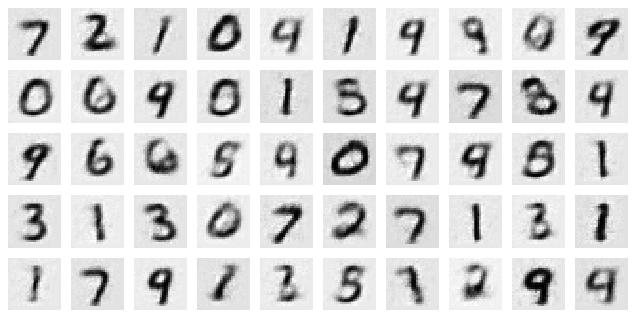

Generated


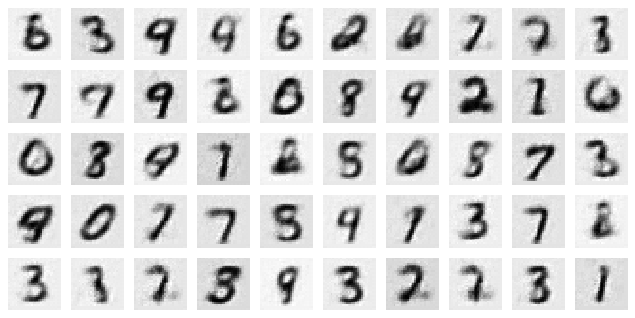

Test losses. G: 0.4523, D: 0.6897
Distribution error weight: 0.13751696050167084
Train Epoch: 16 [0/50000 (0%)]	Losses G: 0.4510, D: 0.6784
Train Epoch: 16 [25000/50000 (50%)]	Losses G: 0.4418, D: 0.6940
Original:


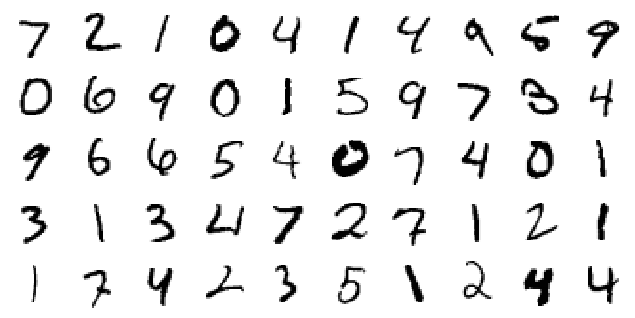

Encoded


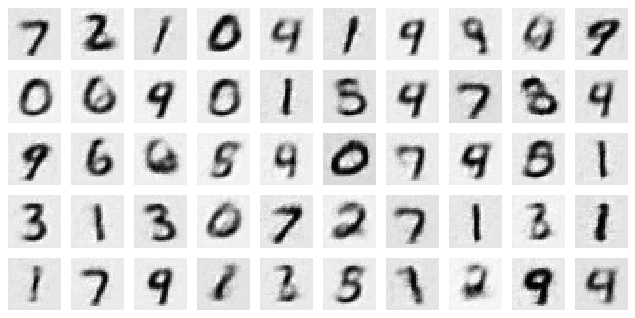

Generated


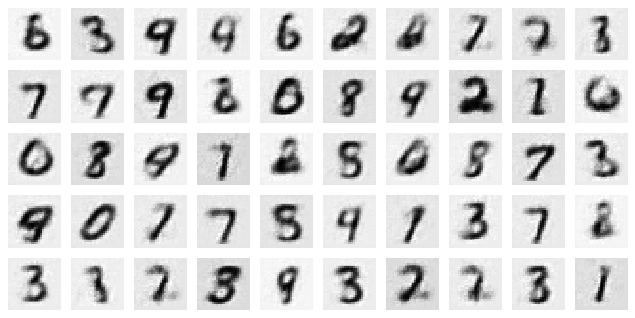

Test losses. G: 0.4369, D: 0.6863
Distribution error weight: 0.14463748037815094
Train Epoch: 17 [0/50000 (0%)]	Losses G: 0.4389, D: 0.6873
Train Epoch: 17 [25000/50000 (50%)]	Losses G: 0.4263, D: 0.6942
Original:


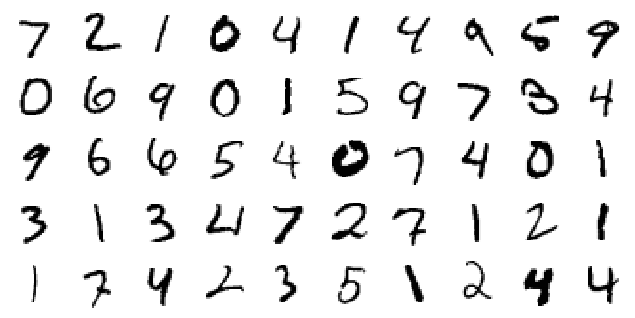

Encoded


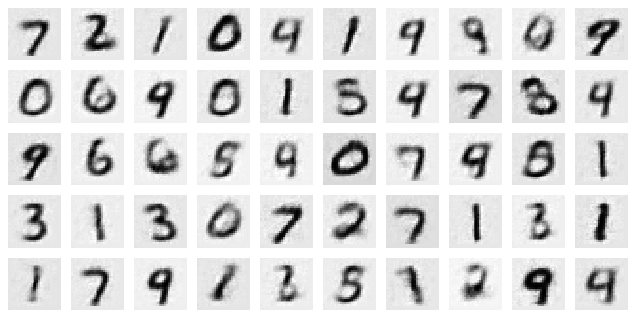

Generated


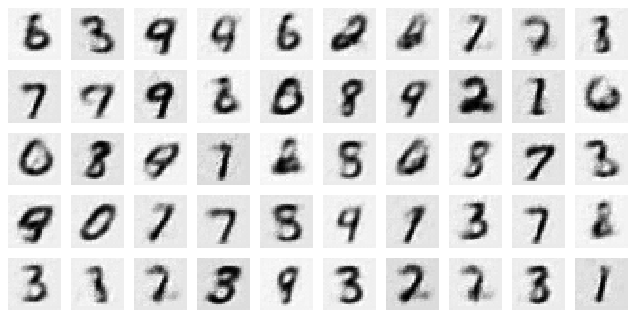

Test losses. G: 0.4210, D: 0.6882
Distribution error weight: 0.14862069487571716
Train Epoch: 18 [0/50000 (0%)]	Losses G: 0.4188, D: 0.6852
Train Epoch: 18 [25000/50000 (50%)]	Losses G: 0.4107, D: 0.6867
Original:


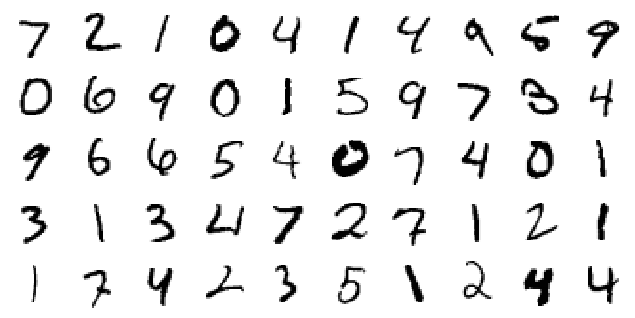

Encoded


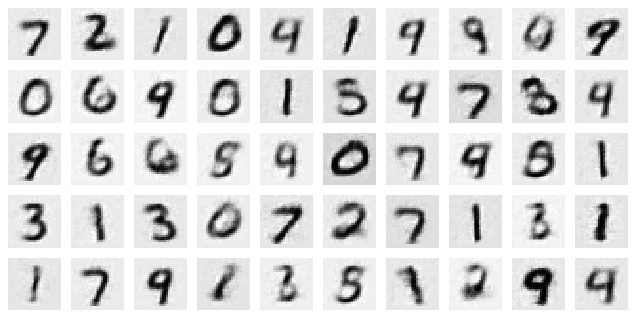

Generated


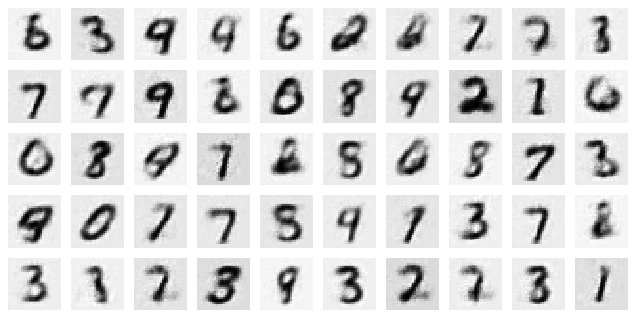

Test losses. G: 0.4063, D: 0.6873
Distribution error weight: 0.15378926694393158
Train Epoch: 19 [0/50000 (0%)]	Losses G: 0.4053, D: 0.6792
Train Epoch: 19 [25000/50000 (50%)]	Losses G: 0.4003, D: 0.6928
Original:


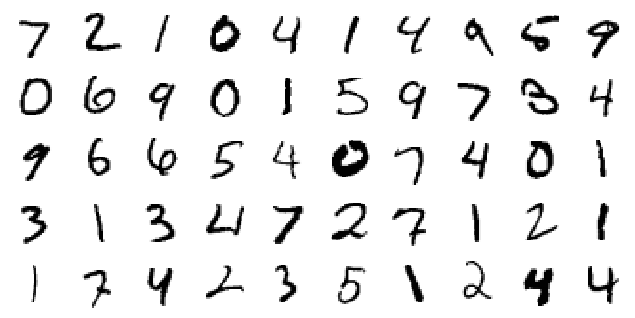

Encoded


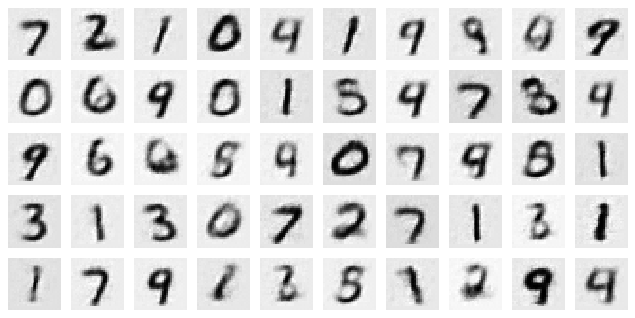

Generated


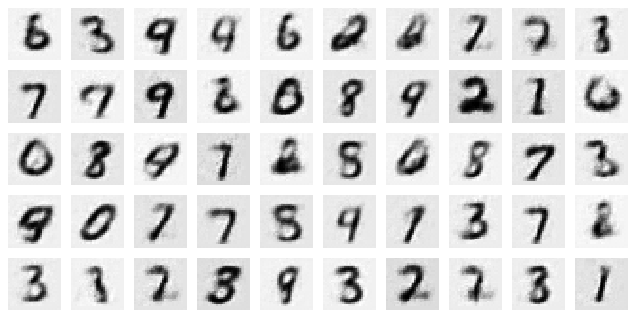

Test losses. G: 0.3930, D: 0.6890
Distribution error weight: 0.15934616327285767
Train Epoch: 20 [0/50000 (0%)]	Losses G: 0.3887, D: 0.6919
Train Epoch: 20 [25000/50000 (50%)]	Losses G: 0.3827, D: 0.6928
Original:


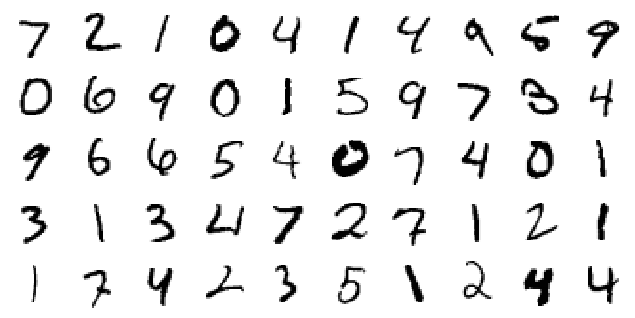

Encoded


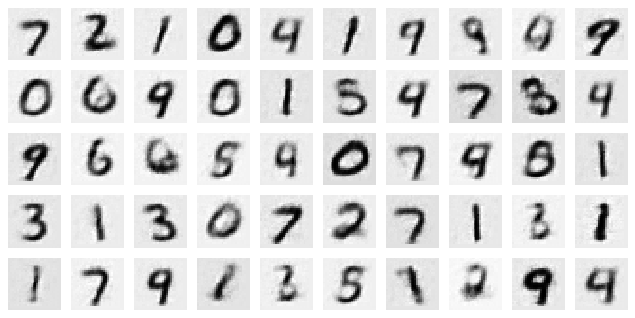

Generated


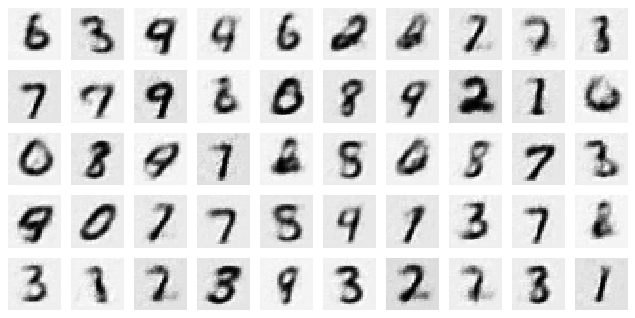

Test losses. G: 0.3805, D: 0.6879
Distribution error weight: 0.16466191411018372
Train Epoch: 21 [0/50000 (0%)]	Losses G: 0.3719, D: 0.6919
Train Epoch: 21 [25000/50000 (50%)]	Losses G: 0.3729, D: 0.6844
Original:


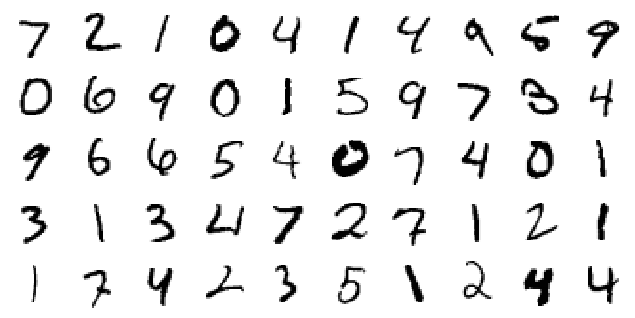

Encoded


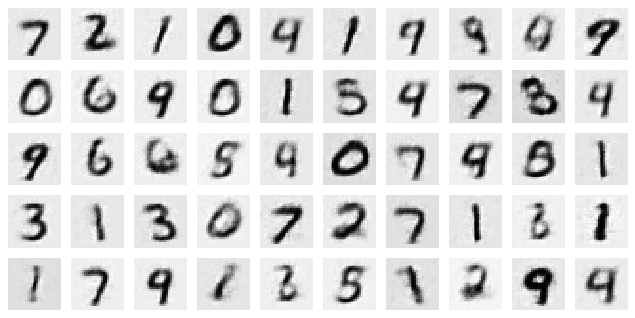

Generated


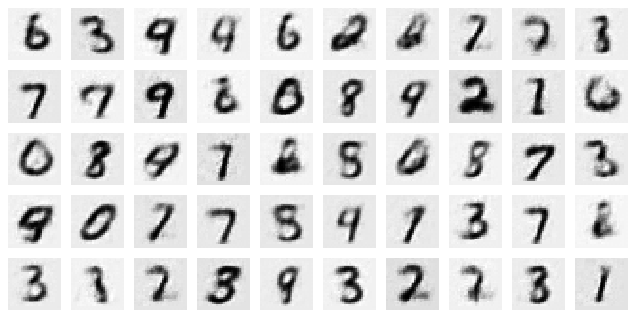

Test losses. G: 0.3690, D: 0.6893
Distribution error weight: 0.1704389899969101
Train Epoch: 22 [0/50000 (0%)]	Losses G: 0.3640, D: 0.6930
Train Epoch: 22 [25000/50000 (50%)]	Losses G: 0.3652, D: 0.6785
Original:


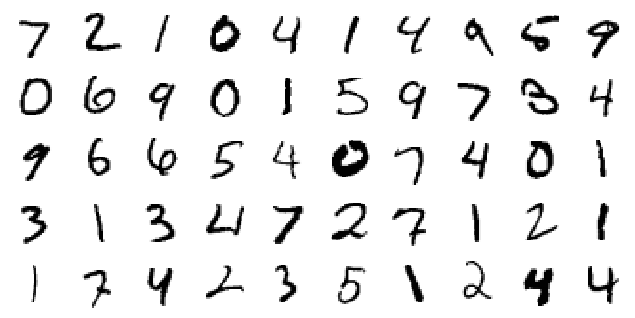

Encoded


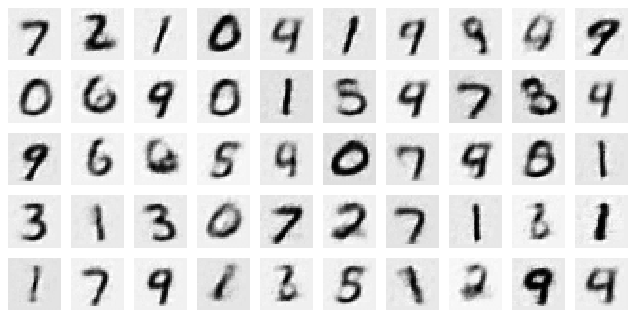

Generated


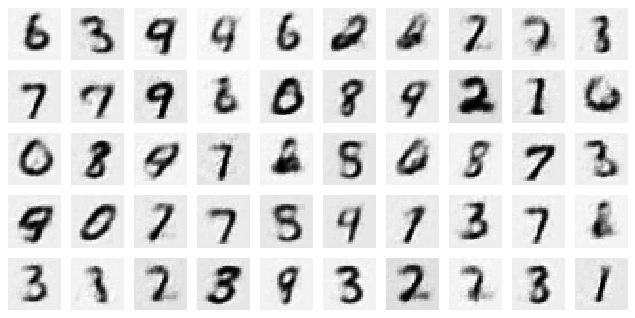

Test losses. G: 0.3574, D: 0.6863
Distribution error weight: 0.17523936927318573
Train Epoch: 23 [0/50000 (0%)]	Losses G: 0.3494, D: 0.6899
Train Epoch: 23 [25000/50000 (50%)]	Losses G: 0.3462, D: 0.6889
Original:


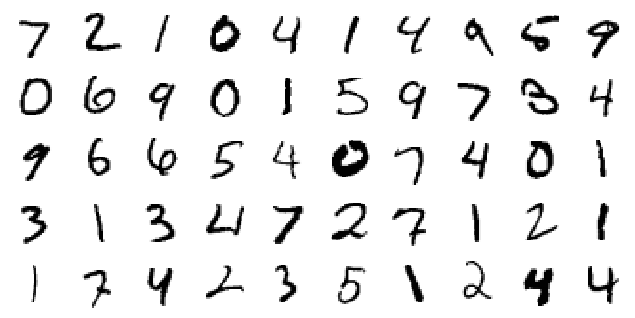

Encoded


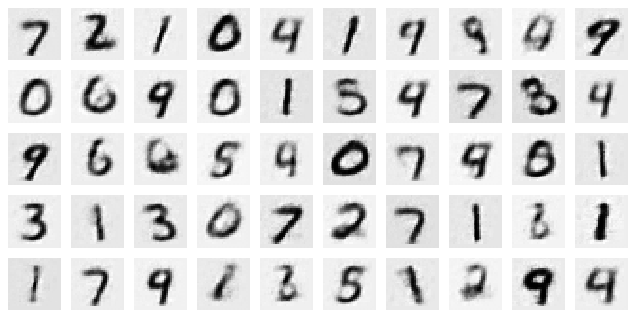

Generated


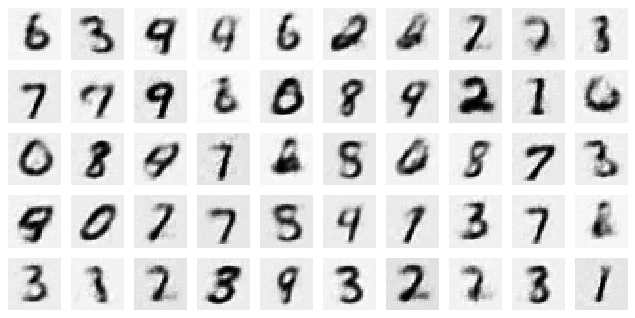

Test losses. G: 0.3474, D: 0.6873
Distribution error weight: 0.18195872008800507
Train Epoch: 24 [0/50000 (0%)]	Losses G: 0.3470, D: 0.6926
Train Epoch: 24 [25000/50000 (50%)]	Losses G: 0.3399, D: 0.6938
Original:


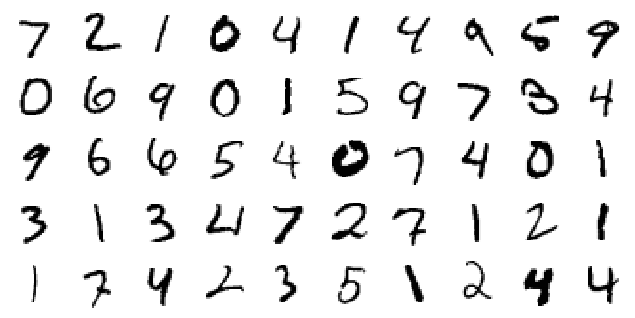

Encoded


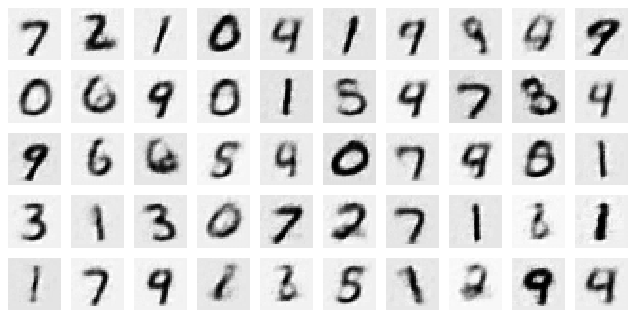

Generated


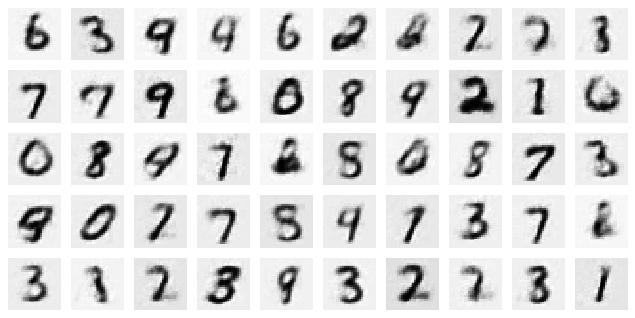

Test losses. G: 0.3367, D: 0.6883
Distribution error weight: 0.18478383123874664
Train Epoch: 25 [0/50000 (0%)]	Losses G: 0.3321, D: 0.6894
Train Epoch: 25 [25000/50000 (50%)]	Losses G: 0.3250, D: 0.6862
Original:


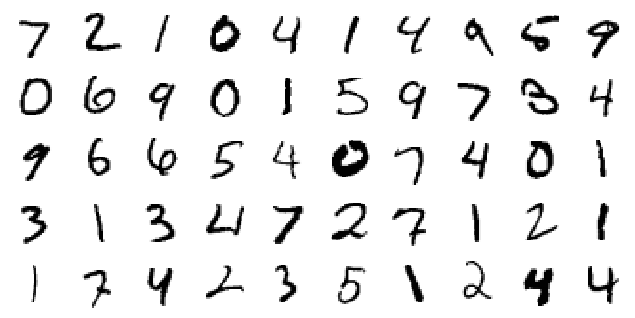

Encoded


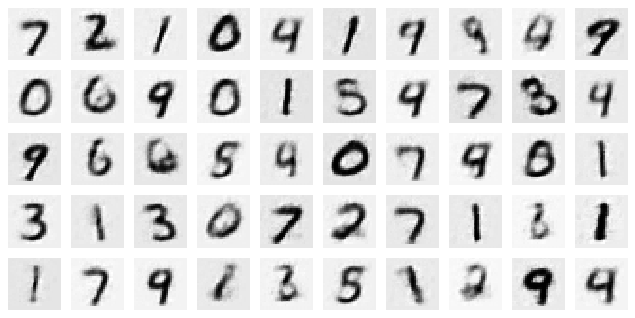

Generated


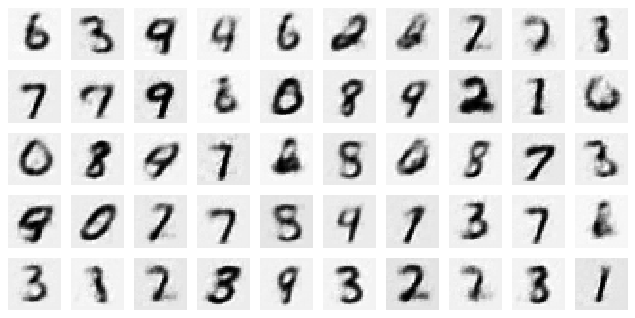

Test losses. G: 0.3281, D: 0.6891
Distribution error weight: 0.1917860060930252
Train Epoch: 26 [0/50000 (0%)]	Losses G: 0.3238, D: 0.6771
Train Epoch: 26 [25000/50000 (50%)]	Losses G: 0.3219, D: 0.6926
Original:


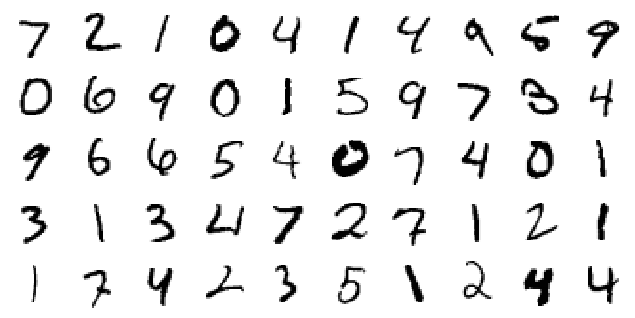

Encoded


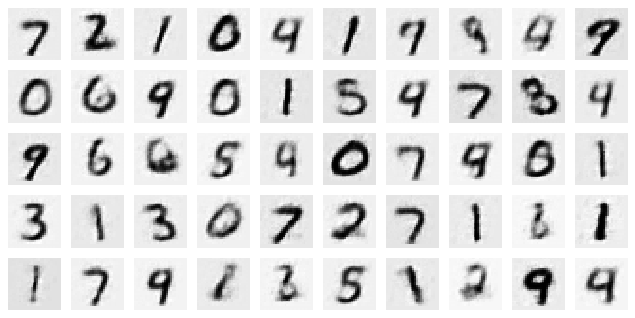

Generated


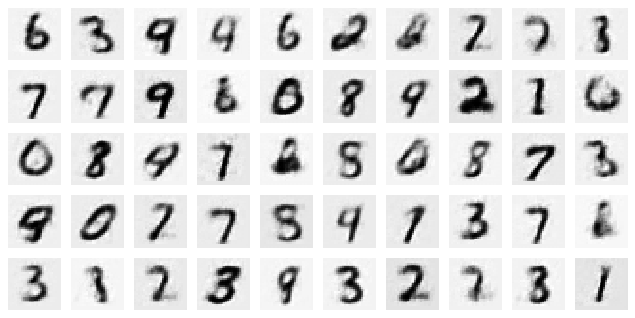

Test losses. G: 0.3188, D: 0.6890
Distribution error weight: 0.19482630491256714
Train Epoch: 27 [0/50000 (0%)]	Losses G: 0.3192, D: 0.6900
Train Epoch: 27 [25000/50000 (50%)]	Losses G: 0.3090, D: 0.6837
Original:


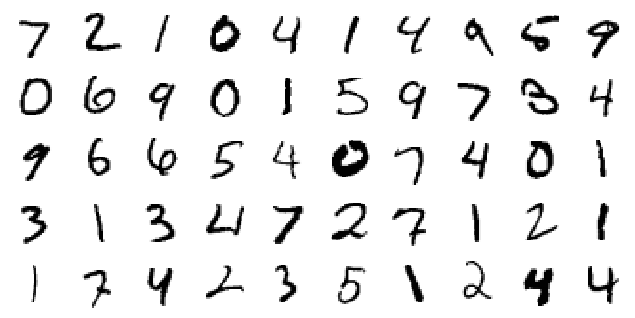

Encoded


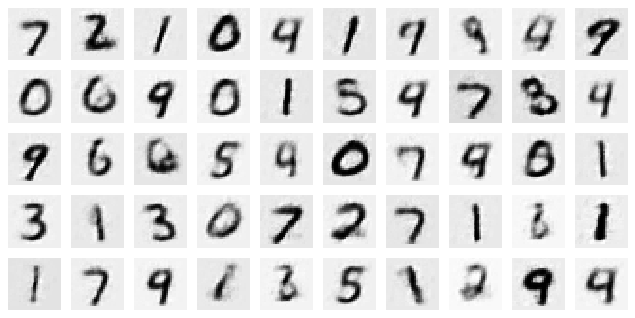

Generated


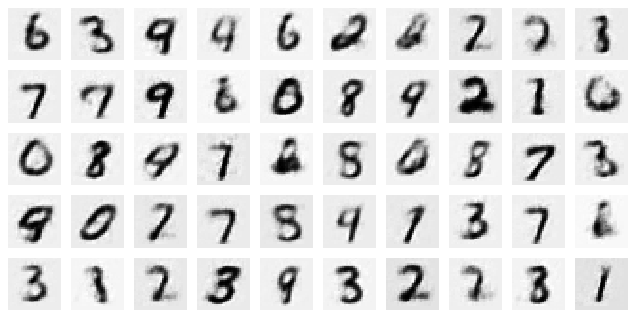

Test losses. G: 0.3112, D: 0.6876
Distribution error weight: 0.20111896097660065
Train Epoch: 28 [0/50000 (0%)]	Losses G: 0.3035, D: 0.6944
Train Epoch: 28 [25000/50000 (50%)]	Losses G: 0.3072, D: 0.6859
Original:


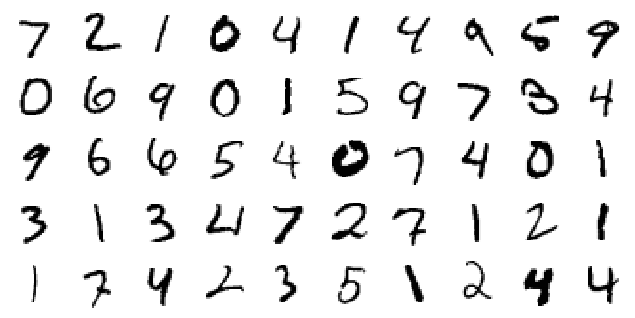

Encoded


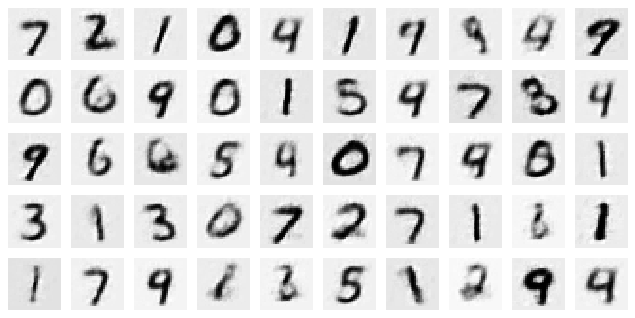

Generated


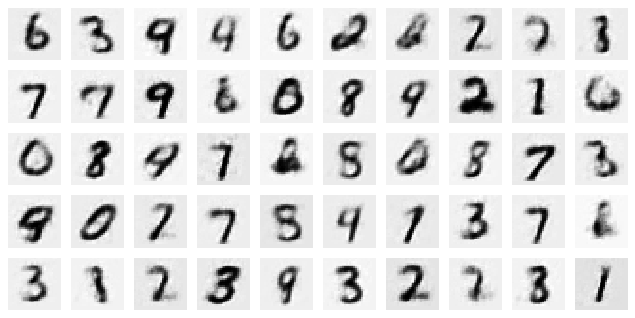

Test losses. G: 0.3040, D: 0.6892
Distribution error weight: 0.20663413405418396
Train Epoch: 29 [0/50000 (0%)]	Losses G: 0.3012, D: 0.6892
Train Epoch: 29 [25000/50000 (50%)]	Losses G: 0.2949, D: 0.6871
Original:


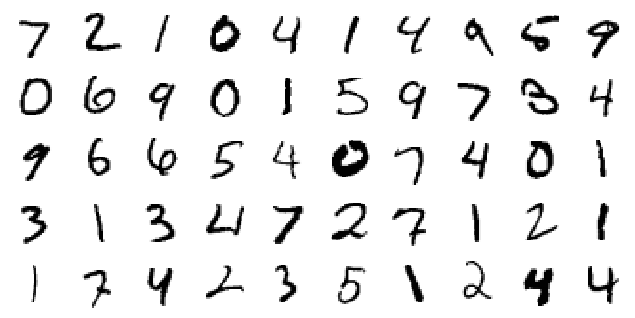

Encoded


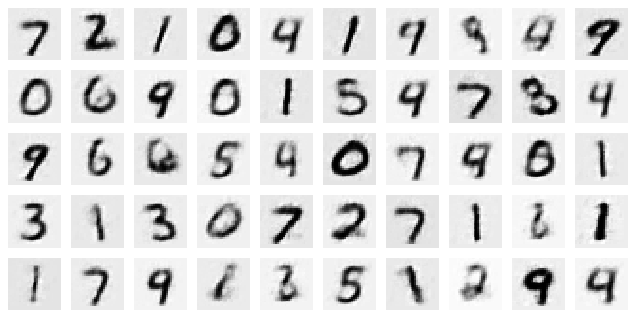

Generated


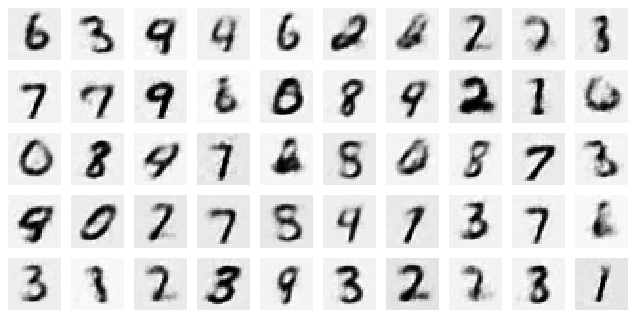

Test losses. G: 0.2967, D: 0.6885
Distribution error weight: 0.21187523007392883
Train Epoch: 30 [0/50000 (0%)]	Losses G: 0.2953, D: 0.6848
Train Epoch: 30 [25000/50000 (50%)]	Losses G: 0.2884, D: 0.6884
Original:


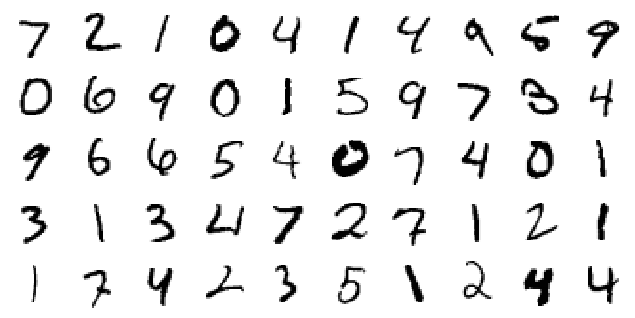

Encoded


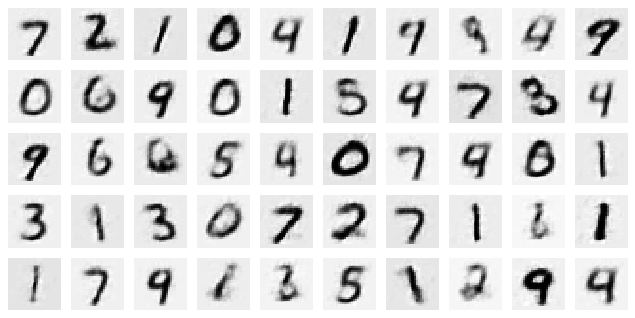

Generated


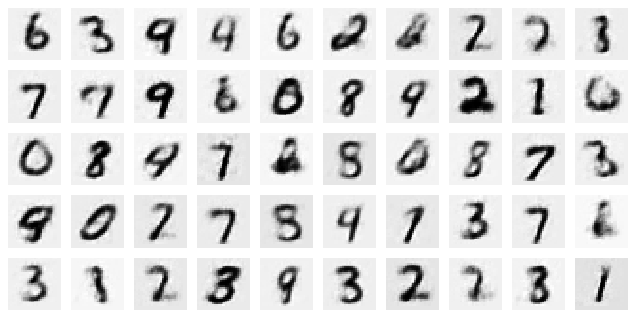

Test losses. G: 0.2902, D: 0.6882
Distribution error weight: 0.21659892797470093
Train Epoch: 31 [0/50000 (0%)]	Losses G: 0.2855, D: 0.6996
Train Epoch: 31 [25000/50000 (50%)]	Losses G: 0.2830, D: 0.6864
Original:


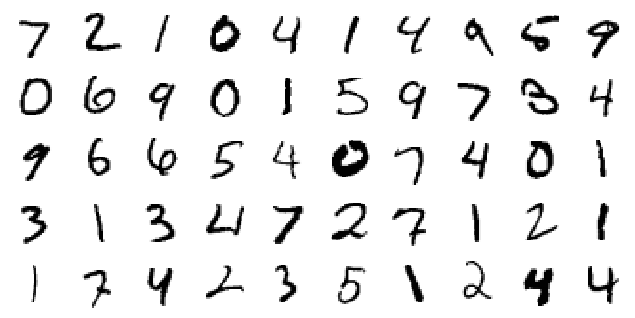

Encoded


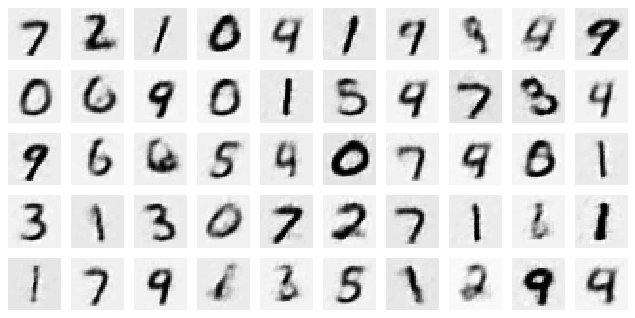

Generated


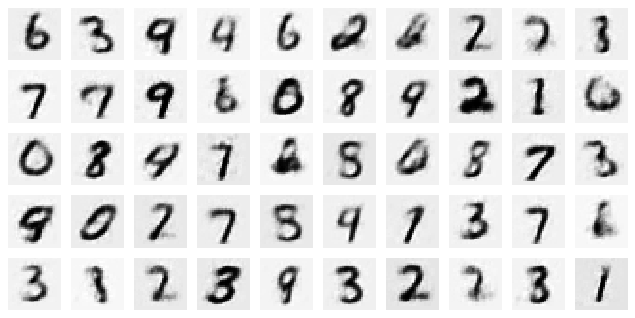

Test losses. G: 0.2840, D: 0.6871
Distribution error weight: 0.22119741141796112
Train Epoch: 32 [0/50000 (0%)]	Losses G: 0.2796, D: 0.6874
Train Epoch: 32 [25000/50000 (50%)]	Losses G: 0.2742, D: 0.6862
Original:


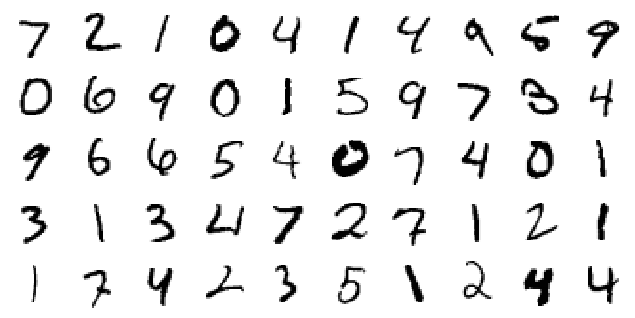

Encoded


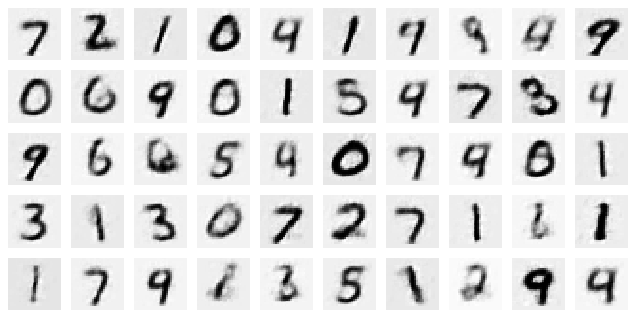

Generated


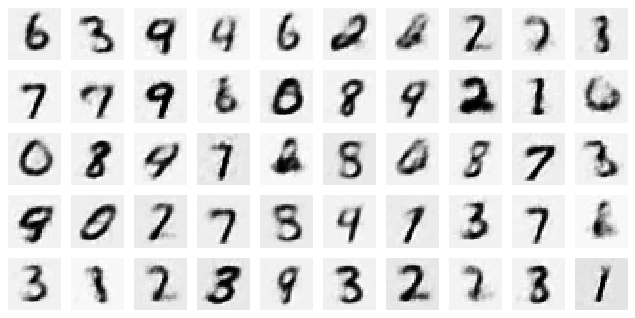

Test losses. G: 0.2779, D: 0.6879
Distribution error weight: 0.22563700377941132
Train Epoch: 33 [0/50000 (0%)]	Losses G: 0.2738, D: 0.6747
Train Epoch: 33 [25000/50000 (50%)]	Losses G: 0.2714, D: 0.6864
Original:


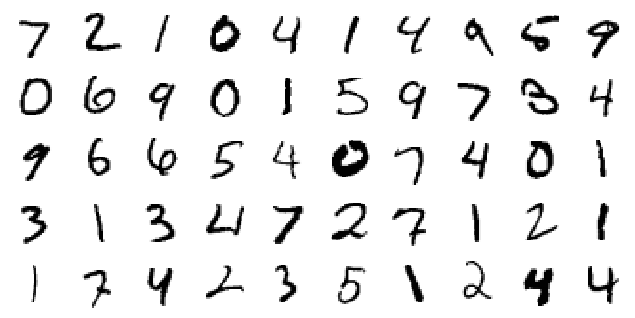

Encoded


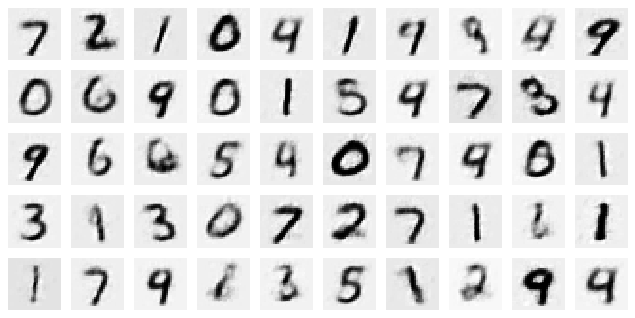

Generated


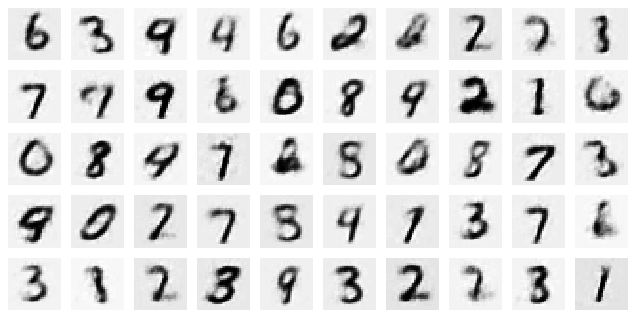

Test losses. G: 0.2724, D: 0.6889
Distribution error weight: 0.22878563404083252
Train Epoch: 34 [0/50000 (0%)]	Losses G: 0.2635, D: 0.6900
Train Epoch: 34 [25000/50000 (50%)]	Losses G: 0.2673, D: 0.6871
Original:


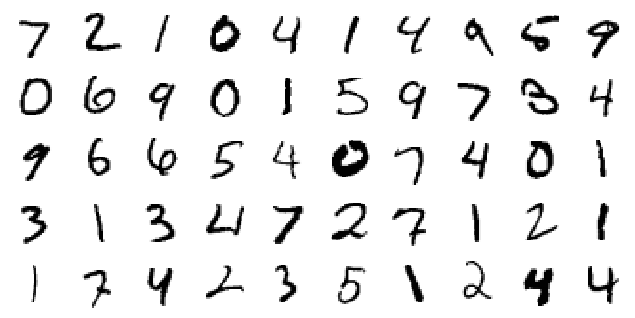

Encoded


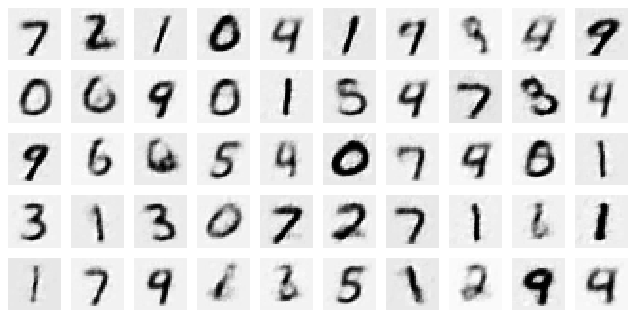

Generated


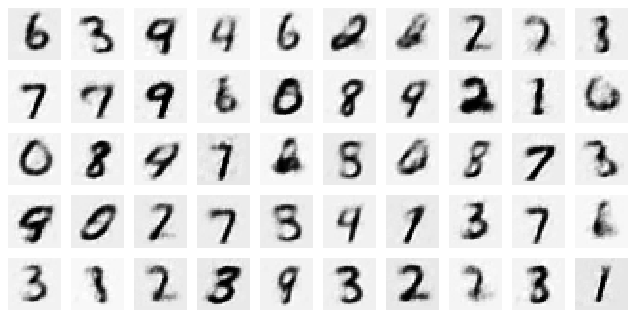

Test losses. G: 0.2673, D: 0.6876
Distribution error weight: 0.2341427206993103
Train Epoch: 35 [0/50000 (0%)]	Losses G: 0.2624, D: 0.6906
Train Epoch: 35 [25000/50000 (50%)]	Losses G: 0.2593, D: 0.6968
Original:


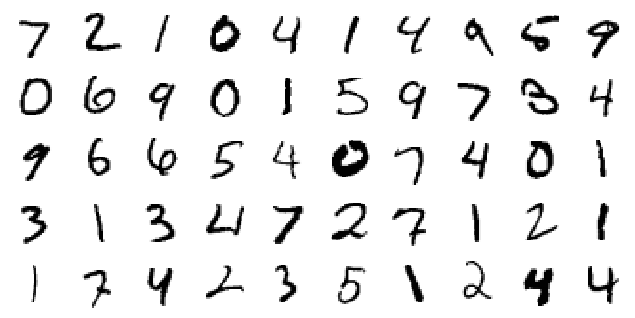

Encoded


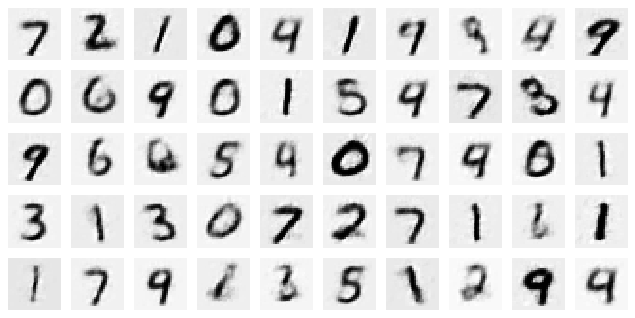

Generated


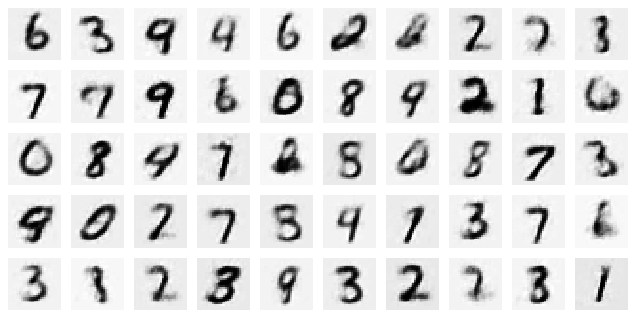

Test losses. G: 0.2625, D: 0.6879
Distribution error weight: 0.2396889179944992
Train Epoch: 36 [0/50000 (0%)]	Losses G: 0.2591, D: 0.6854
Train Epoch: 36 [25000/50000 (50%)]	Losses G: 0.2546, D: 0.6865
Original:


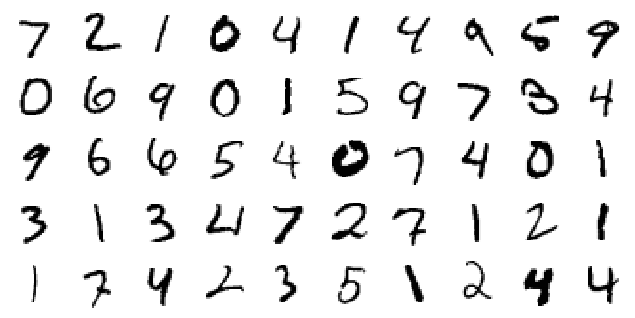

Encoded


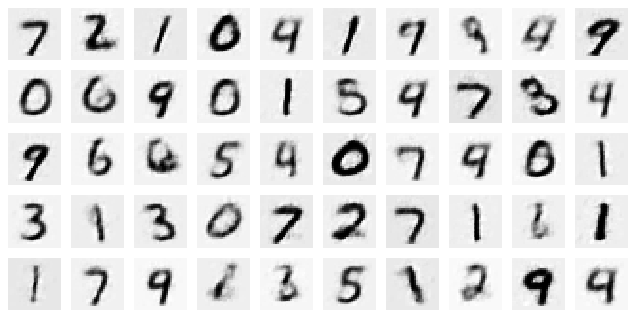

Generated


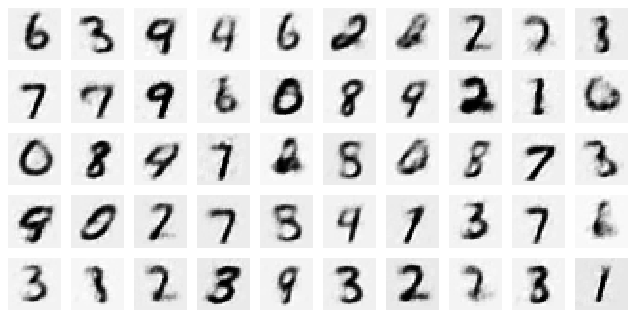

Test losses. G: 0.2581, D: 0.6884
Distribution error weight: 0.24254164099693298
Train Epoch: 37 [0/50000 (0%)]	Losses G: 0.2502, D: 0.6939
Train Epoch: 37 [25000/50000 (50%)]	Losses G: 0.2479, D: 0.6905
Original:


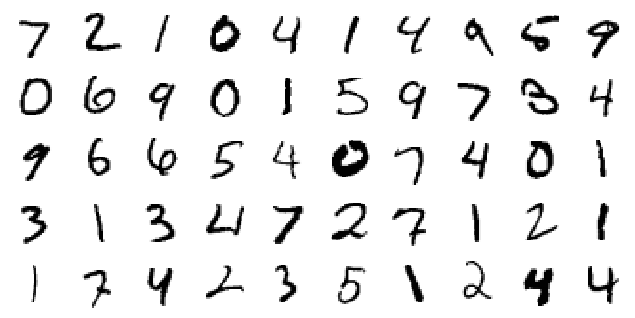

Encoded


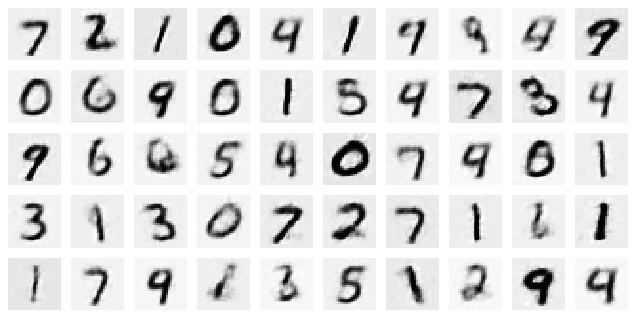

Generated


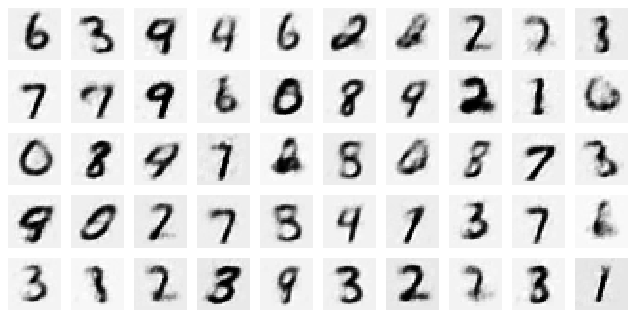

Test losses. G: 0.2537, D: 0.6905
Distribution error weight: 0.24722610414028168
Train Epoch: 38 [0/50000 (0%)]	Losses G: 0.2477, D: 0.6822
Train Epoch: 38 [25000/50000 (50%)]	Losses G: 0.2443, D: 0.6891
Original:


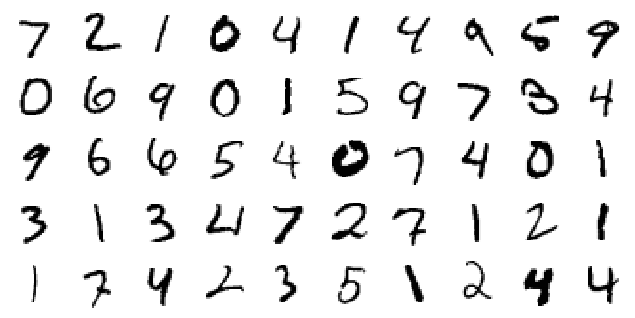

Encoded


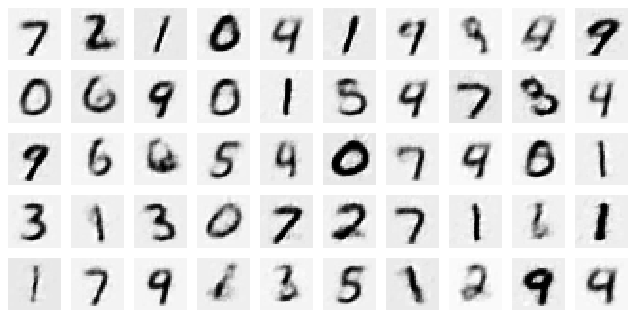

Generated


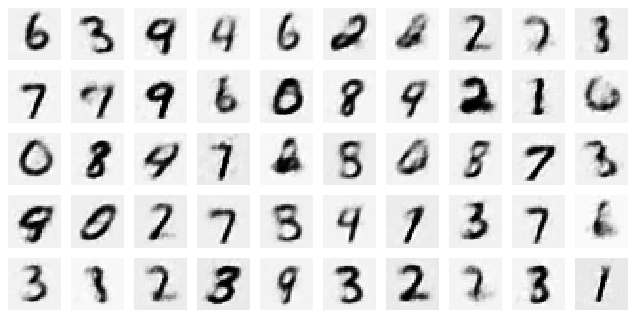

Test losses. G: 0.2497, D: 0.6902
Distribution error weight: 0.25136590003967285
Train Epoch: 39 [0/50000 (0%)]	Losses G: 0.2431, D: 0.6896
Train Epoch: 39 [25000/50000 (50%)]	Losses G: 0.2434, D: 0.6928
Original:


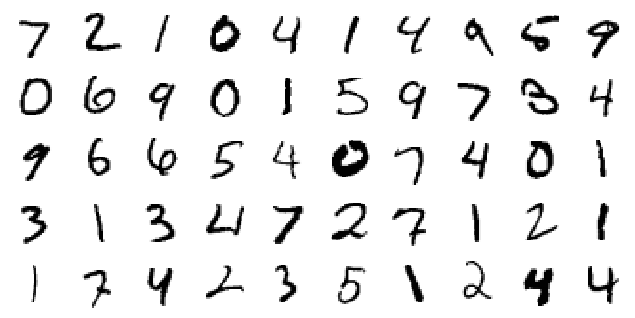

Encoded


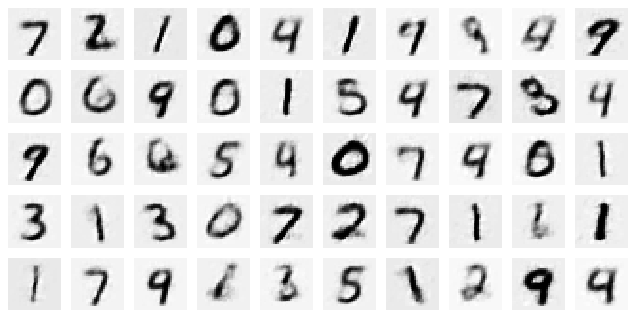

Generated


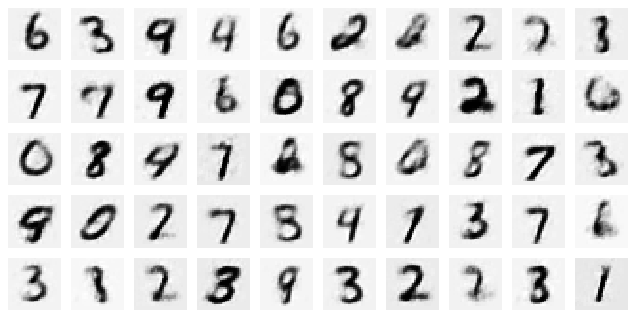

Test losses. G: 0.2459, D: 0.6885
Distribution error weight: 0.2548362910747528
Train Epoch: 40 [0/50000 (0%)]	Losses G: 0.2429, D: 0.6937
Train Epoch: 40 [25000/50000 (50%)]	Losses G: 0.2369, D: 0.6880
Original:


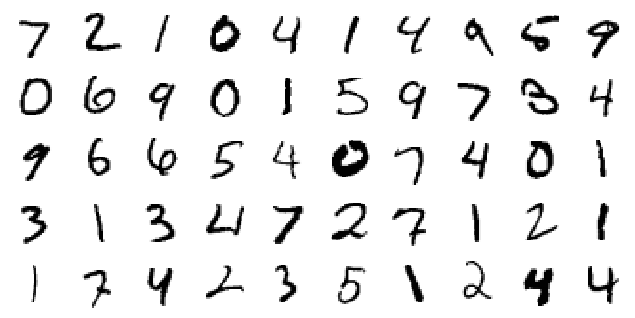

Encoded


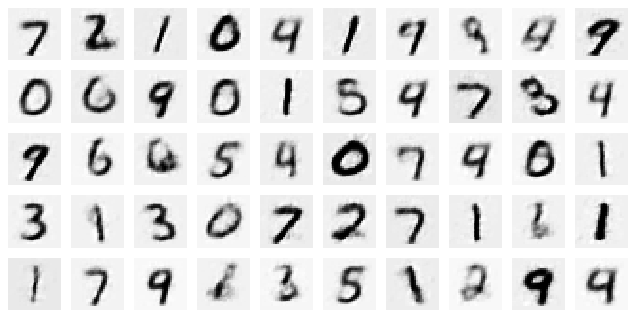

Generated


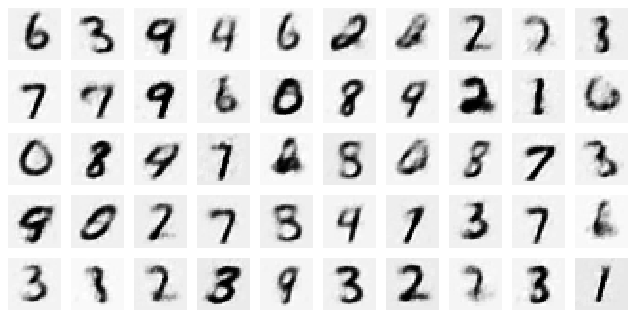

Test losses. G: 0.2421, D: 0.6877
Distribution error weight: 0.25745275616645813
Train Epoch: 41 [0/50000 (0%)]	Losses G: 0.2395, D: 0.6889
Train Epoch: 41 [25000/50000 (50%)]	Losses G: 0.2338, D: 0.6883
Original:


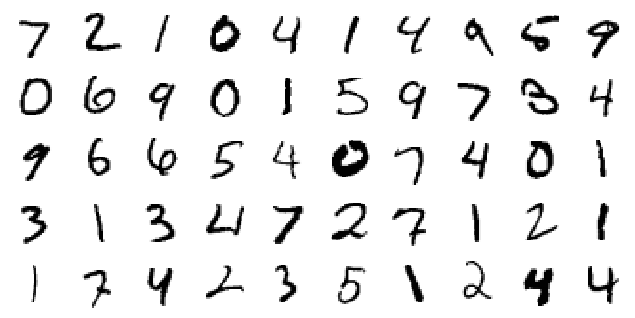

Encoded


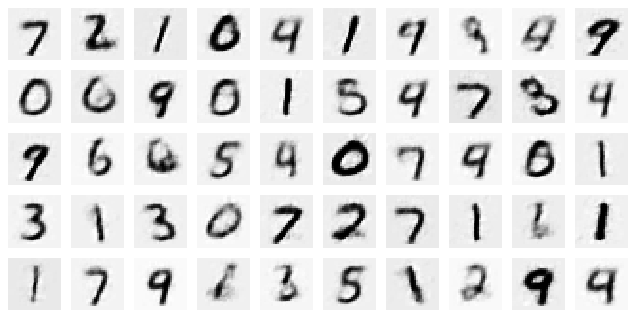

Generated


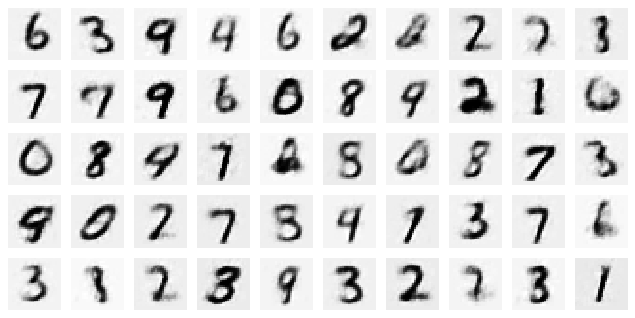

Test losses. G: 0.2396, D: 0.6886
Distribution error weight: 0.262560099363327
Train Epoch: 42 [0/50000 (0%)]	Losses G: 0.2351, D: 0.6968
Train Epoch: 42 [25000/50000 (50%)]	Losses G: 0.2323, D: 0.6900
Original:


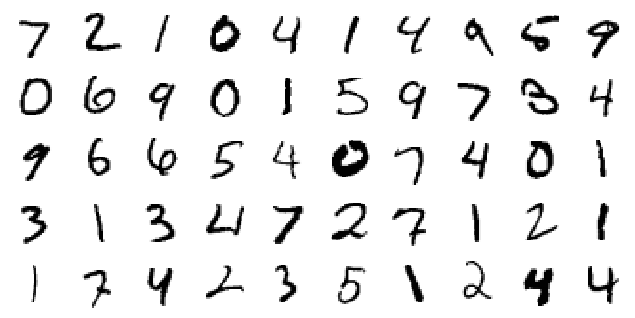

Encoded


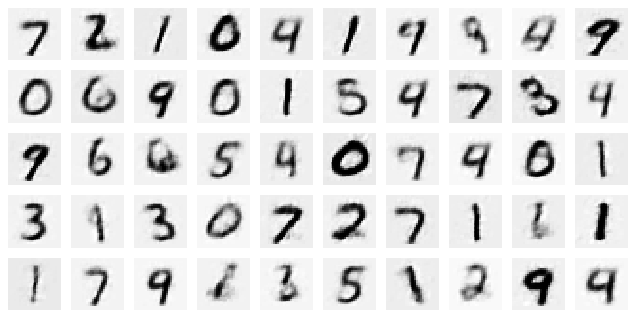

Generated


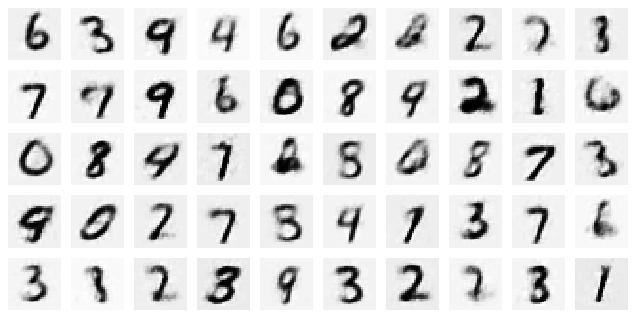

Test losses. G: 0.2364, D: 0.6869
Distribution error weight: 0.2660772204399109
Train Epoch: 43 [0/50000 (0%)]	Losses G: 0.2281, D: 0.6824
Train Epoch: 43 [25000/50000 (50%)]	Losses G: 0.2293, D: 0.6871
Original:


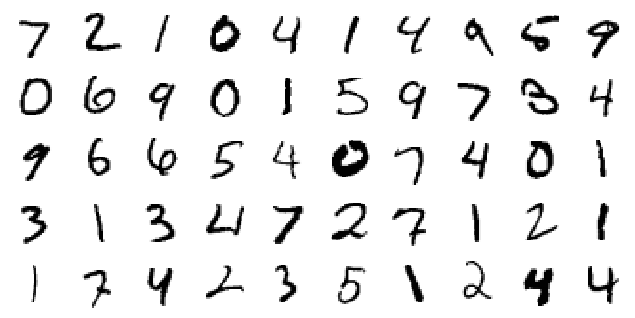

Encoded


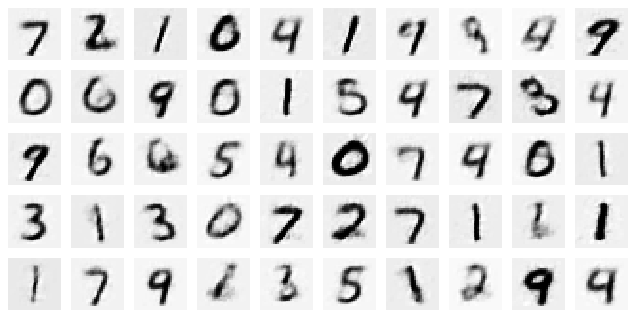

Generated


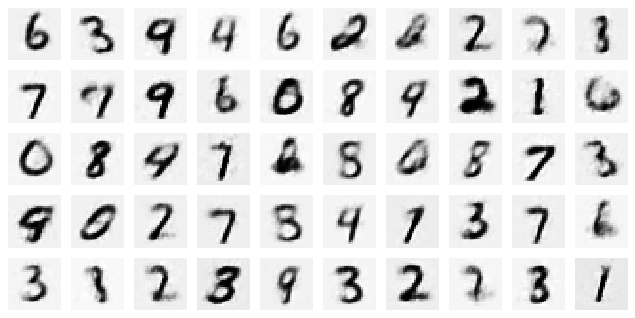

Test losses. G: 0.2334, D: 0.6855
Distribution error weight: 0.26993507146835327
Train Epoch: 44 [0/50000 (0%)]	Losses G: 0.2253, D: 0.6873
Train Epoch: 44 [25000/50000 (50%)]	Losses G: 0.2283, D: 0.6971
Original:


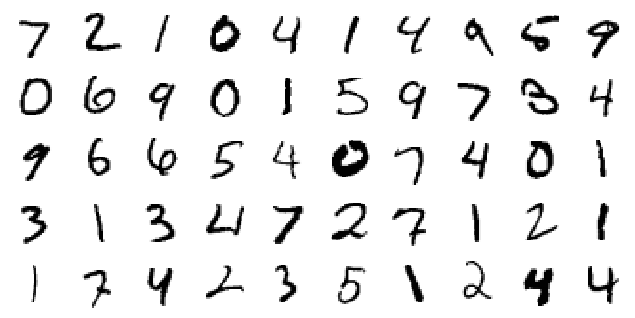

Encoded


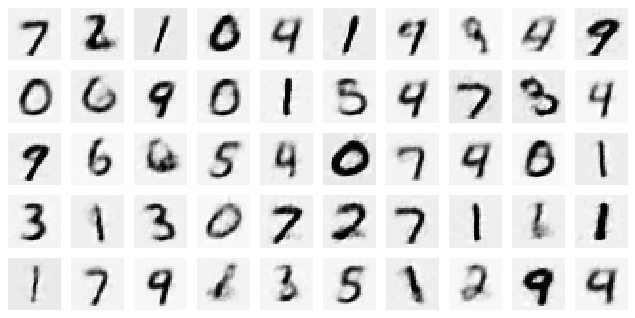

Generated


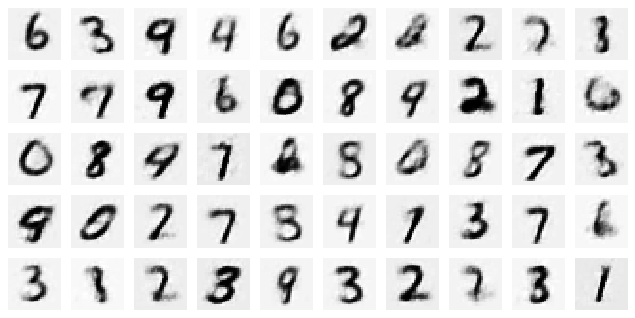

Test losses. G: 0.2305, D: 0.6889
Distribution error weight: 0.2716529965400696
Train Epoch: 45 [0/50000 (0%)]	Losses G: 0.2175, D: 0.6888
Train Epoch: 45 [25000/50000 (50%)]	Losses G: 0.2326, D: 0.6894
Original:


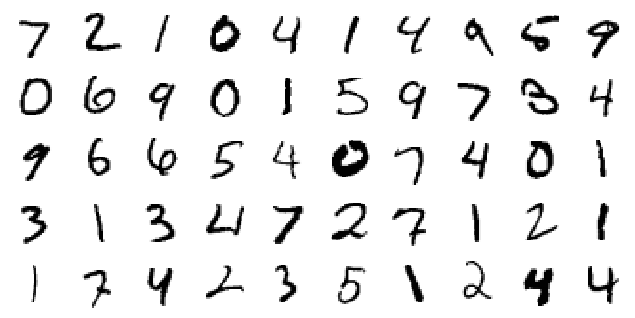

Encoded


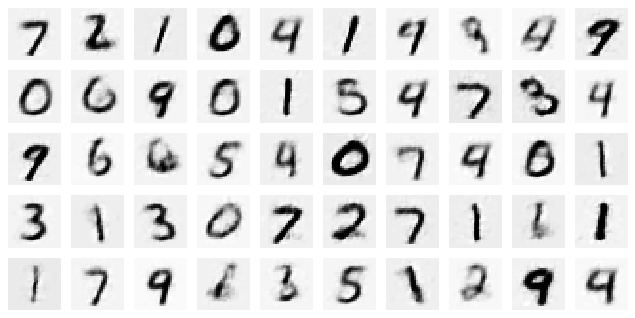

Generated


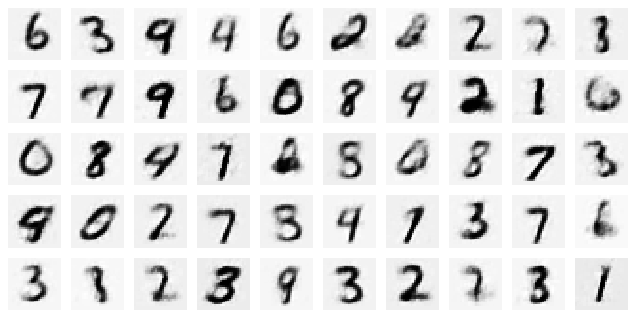

Test losses. G: 0.2278, D: 0.6877
Distribution error weight: 0.2737758159637451
Train Epoch: 46 [0/50000 (0%)]	Losses G: 0.2237, D: 0.6748
Train Epoch: 46 [25000/50000 (50%)]	Losses G: 0.2220, D: 0.6900
Original:


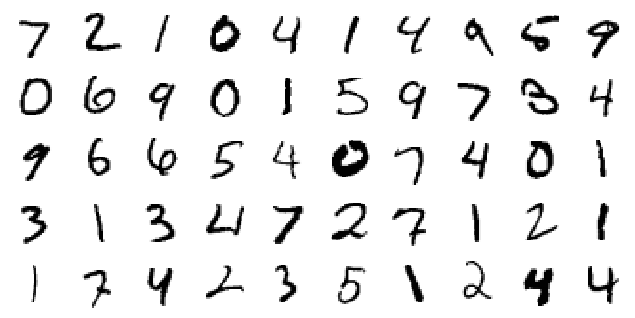

Encoded


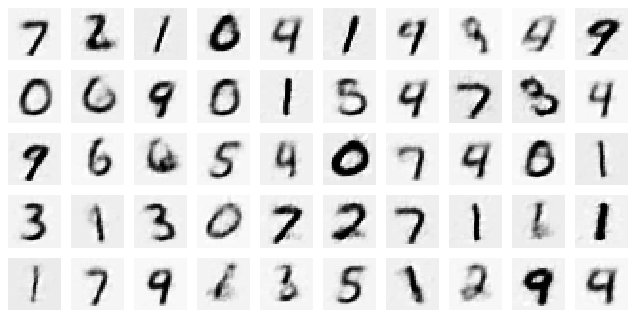

Generated


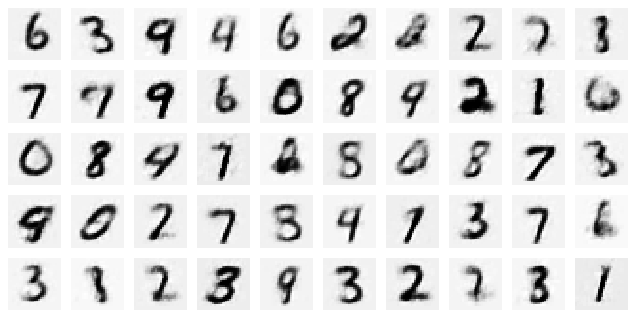

Test losses. G: 0.2258, D: 0.6885
Distribution error weight: 0.277741402387619
Train Epoch: 47 [0/50000 (0%)]	Losses G: 0.2185, D: 0.6899
Train Epoch: 47 [25000/50000 (50%)]	Losses G: 0.2190, D: 0.6877
Original:


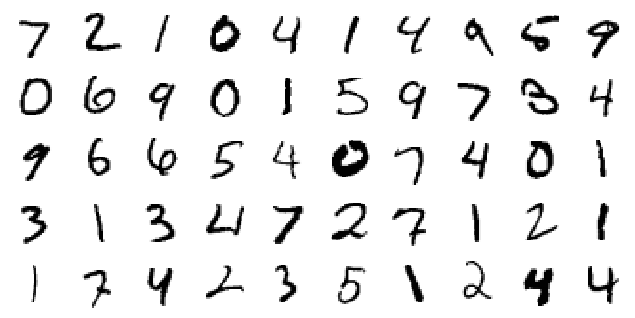

Encoded


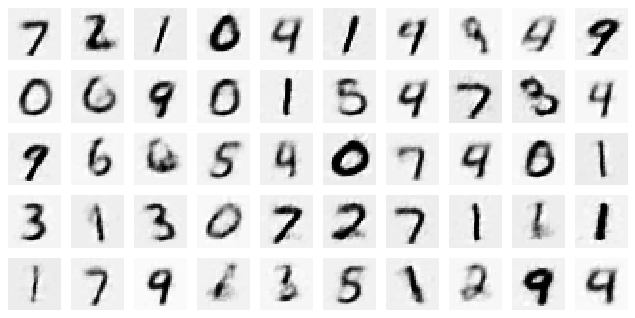

Generated


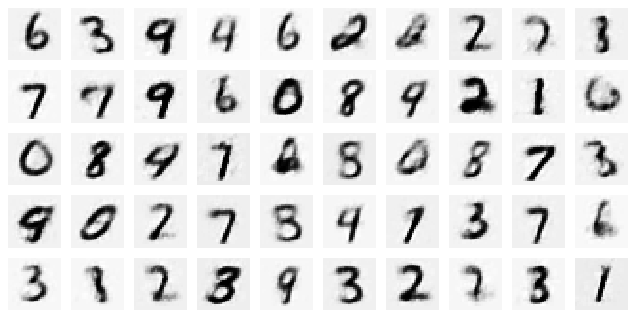

Test losses. G: 0.2237, D: 0.6871
Distribution error weight: 0.28033560514450073
Train Epoch: 48 [0/50000 (0%)]	Losses G: 0.2184, D: 0.6867
Train Epoch: 48 [25000/50000 (50%)]	Losses G: 0.2149, D: 0.6822
Original:


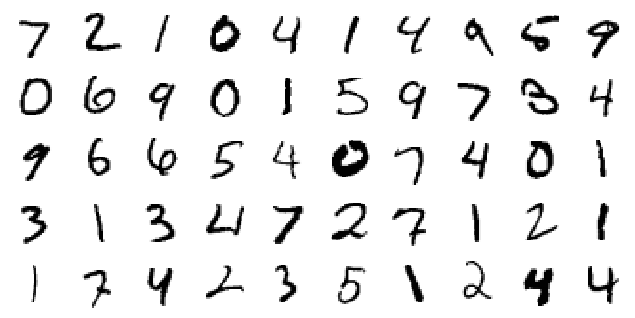

Encoded


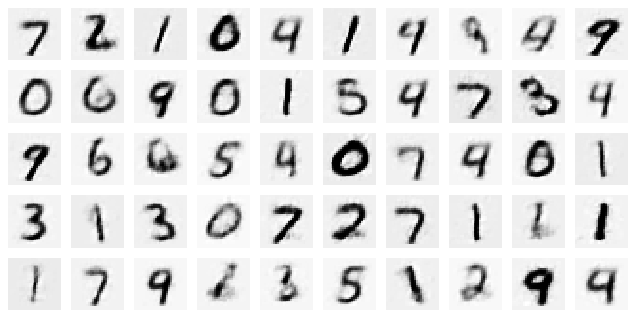

Generated


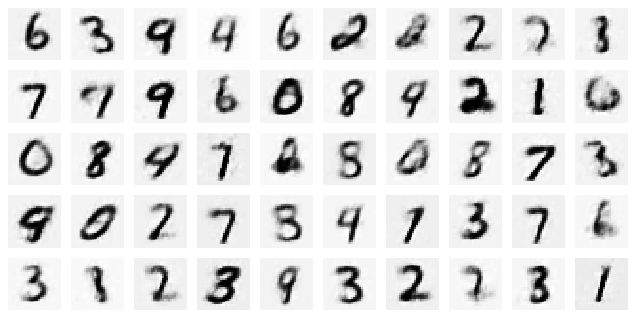

Test losses. G: 0.2220, D: 0.6877
Distribution error weight: 0.28380438685417175
Train Epoch: 49 [0/50000 (0%)]	Losses G: 0.2136, D: 0.6909
Train Epoch: 49 [25000/50000 (50%)]	Losses G: 0.2184, D: 0.6883
Original:


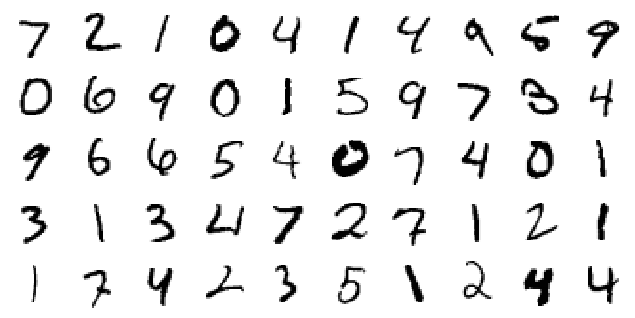

Encoded


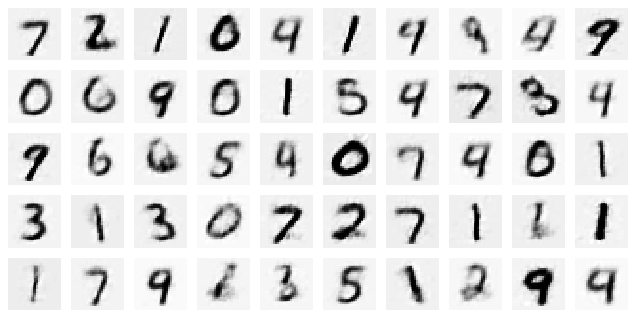

Generated


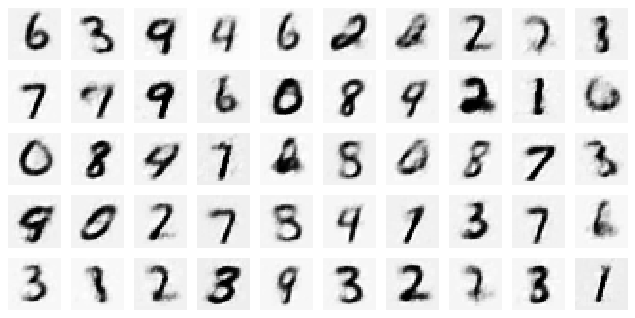

Test losses. G: 0.2196, D: 0.6869
Distribution error weight: 0.2868648171424866
Train Epoch: 50 [0/50000 (0%)]	Losses G: 0.2128, D: 0.6882
Train Epoch: 50 [25000/50000 (50%)]	Losses G: 0.2134, D: 0.6854
Original:


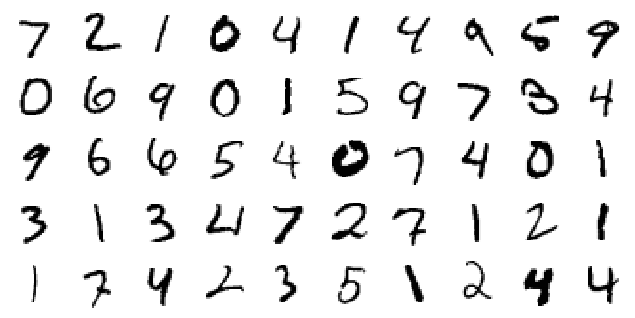

Encoded


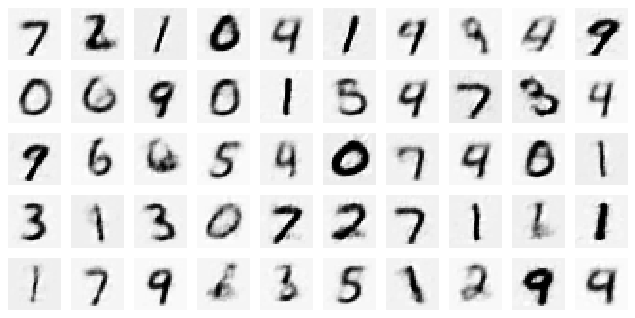

Generated


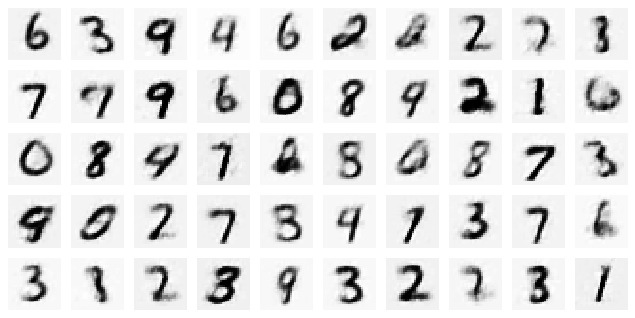

Test losses. G: 0.2182, D: 0.6864
Distribution error weight: 0.28916066884994507
Train Epoch: 51 [0/50000 (0%)]	Losses G: 0.2066, D: 0.6811
Train Epoch: 51 [25000/50000 (50%)]	Losses G: 0.2059, D: 0.6823
Original:


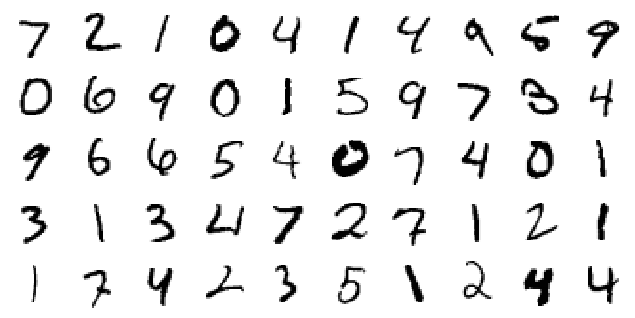

Encoded


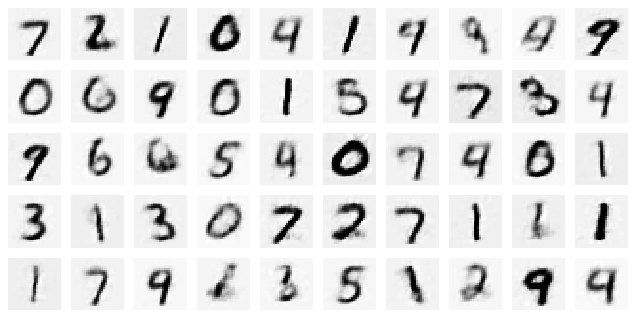

Generated


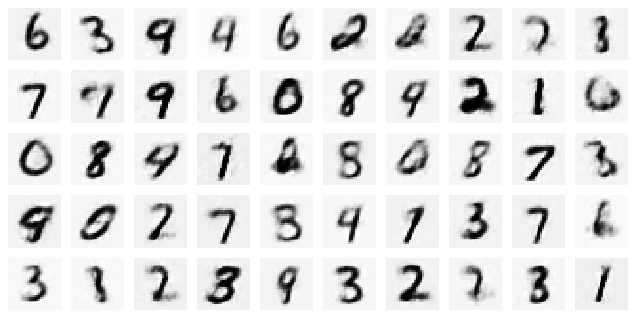

Test losses. G: 0.2158, D: 0.6882
Distribution error weight: 0.2892506718635559
Train Epoch: 52 [0/50000 (0%)]	Losses G: 0.2084, D: 0.6879
Train Epoch: 52 [25000/50000 (50%)]	Losses G: 0.2056, D: 0.6868
Original:


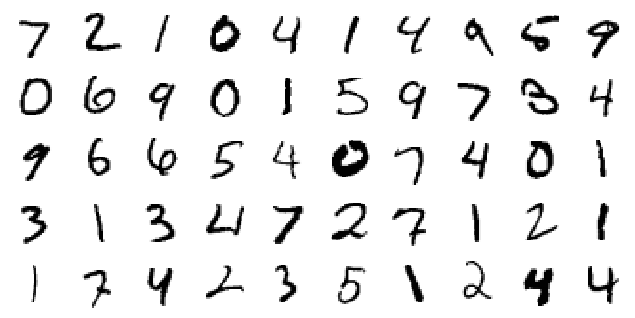

Encoded


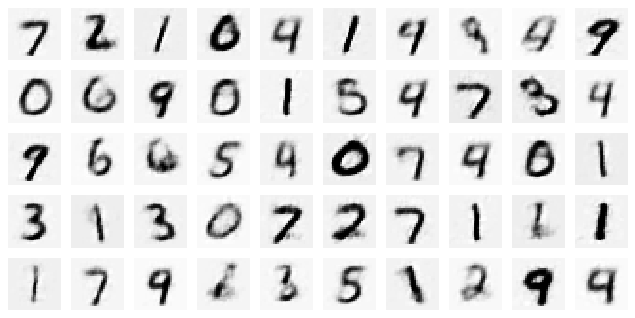

Generated


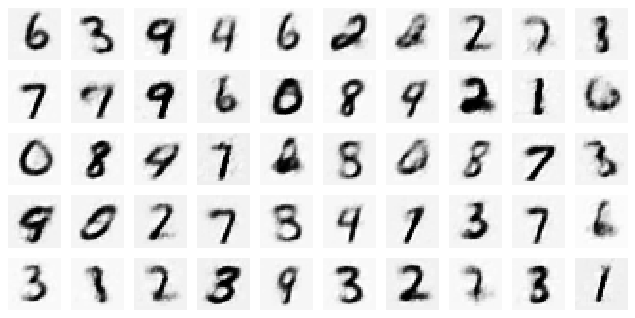

Test losses. G: 0.2143, D: 0.6866
Distribution error weight: 0.29333776235580444
Train Epoch: 53 [0/50000 (0%)]	Losses G: 0.2086, D: 0.6837
Train Epoch: 53 [25000/50000 (50%)]	Losses G: 0.2061, D: 0.6912
Original:


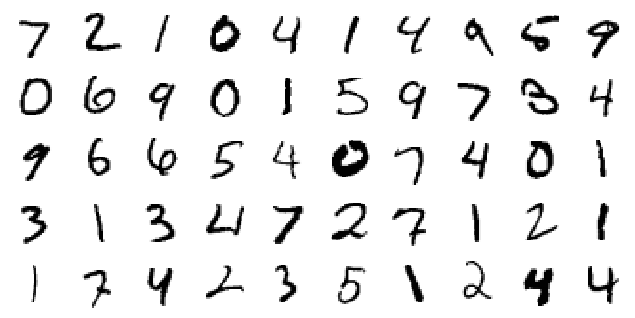

Encoded


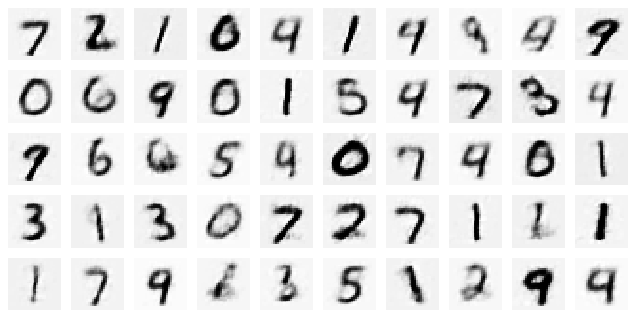

Generated


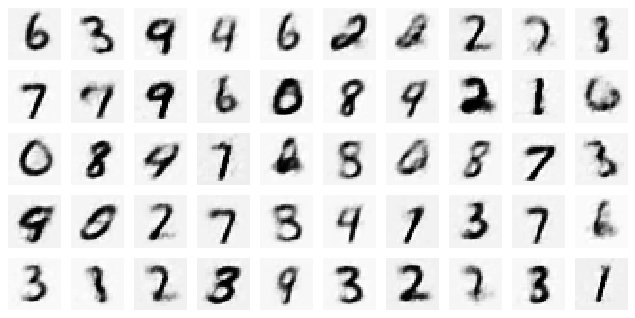

Test losses. G: 0.2129, D: 0.6861
Distribution error weight: 0.29575133323669434
Train Epoch: 54 [0/50000 (0%)]	Losses G: 0.2004, D: 0.6856
Train Epoch: 54 [25000/50000 (50%)]	Losses G: 0.2075, D: 0.6906
Original:


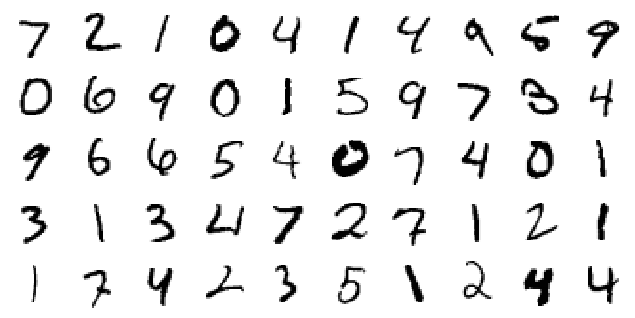

Encoded


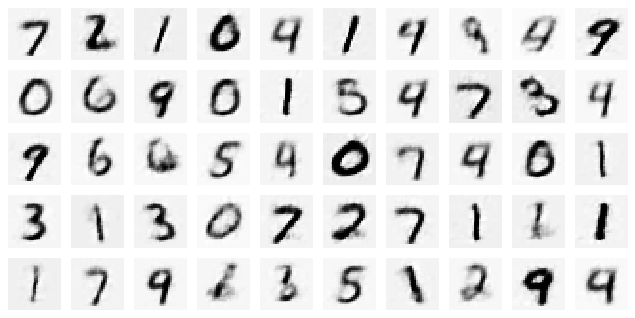

Generated


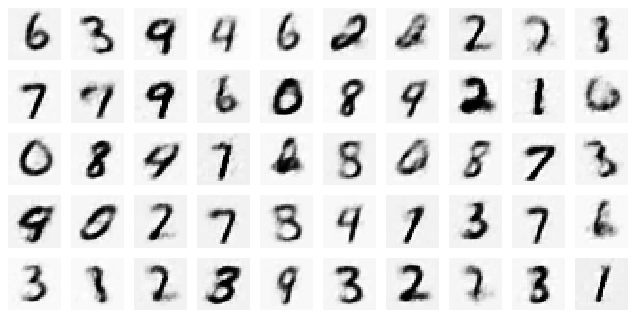

Test losses. G: 0.2116, D: 0.6880
Distribution error weight: 0.2974320650100708
Train Epoch: 55 [0/50000 (0%)]	Losses G: 0.2019, D: 0.6851
Train Epoch: 55 [25000/50000 (50%)]	Losses G: 0.2045, D: 0.6932
Original:


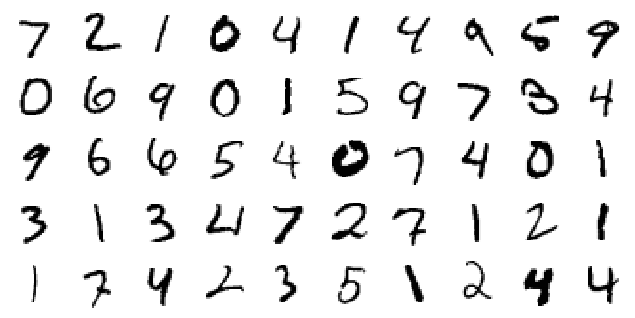

Encoded


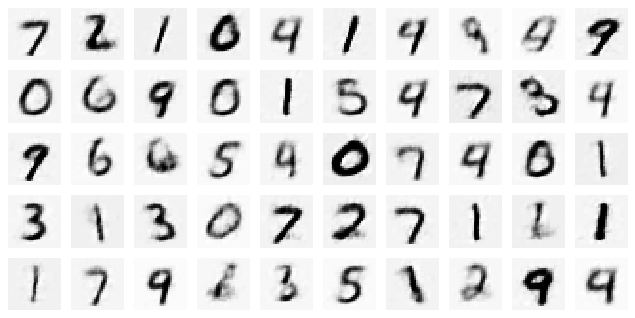

Generated


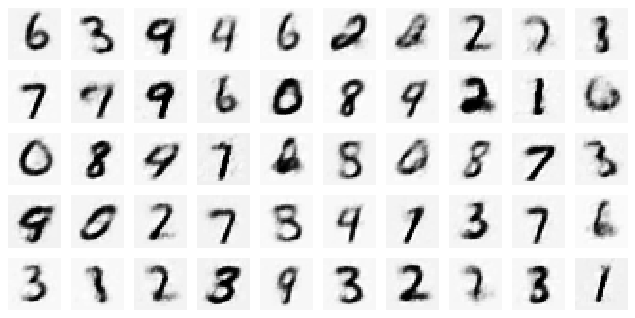

Test losses. G: 0.2104, D: 0.6865
Distribution error weight: 0.2998998463153839
Train Epoch: 56 [0/50000 (0%)]	Losses G: 0.1994, D: 0.6857
Train Epoch: 56 [25000/50000 (50%)]	Losses G: 0.1991, D: 0.6869
Original:


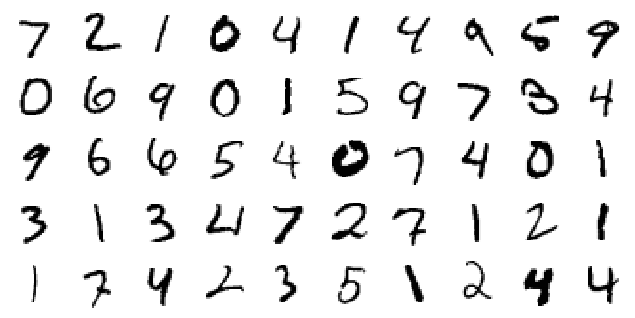

Encoded


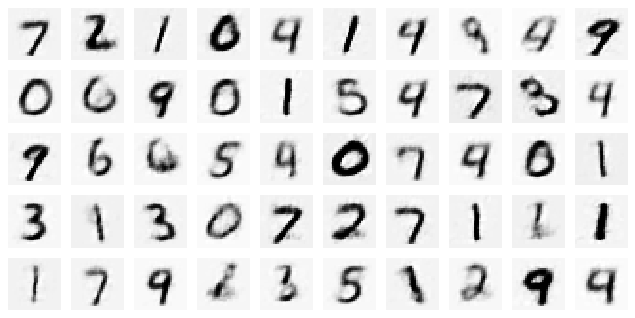

Generated


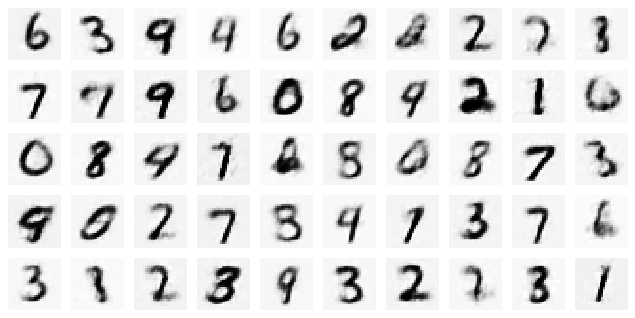

Test losses. G: 0.2092, D: 0.6850
Distribution error weight: 0.3025035262107849
Train Epoch: 57 [0/50000 (0%)]	Losses G: 0.1971, D: 0.6869
Train Epoch: 57 [25000/50000 (50%)]	Losses G: 0.1985, D: 0.6899
Original:


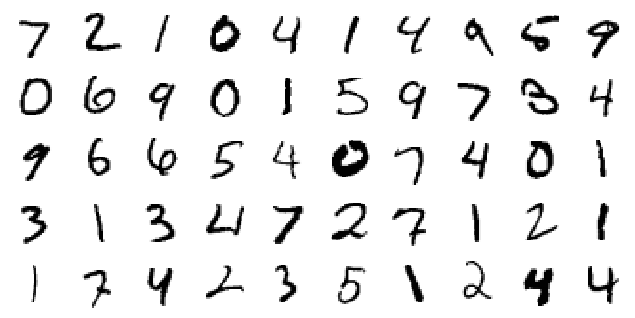

Encoded


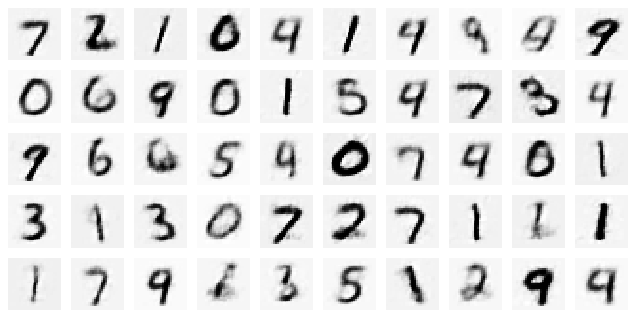

Generated


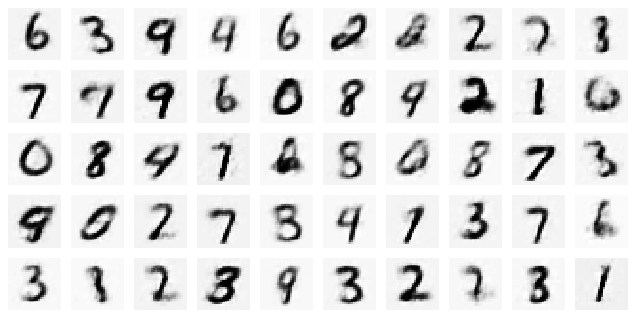

Test losses. G: 0.2083, D: 0.6852
Distribution error weight: 0.3042042851448059
Train Epoch: 58 [0/50000 (0%)]	Losses G: 0.2037, D: 0.6917
Train Epoch: 58 [25000/50000 (50%)]	Losses G: 0.2021, D: 0.7011
Original:


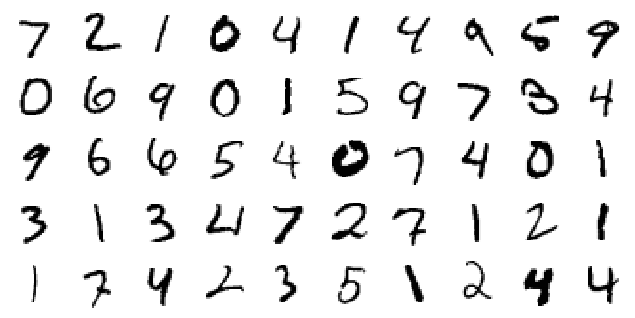

Encoded


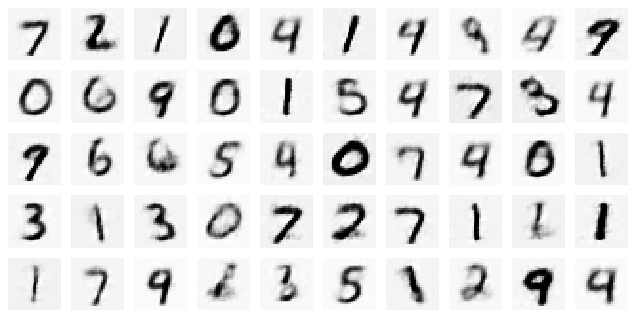

Generated


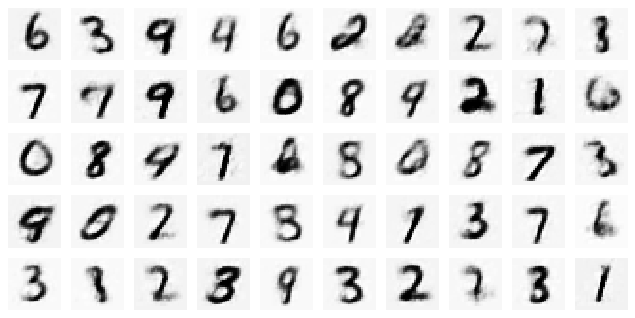

Test losses. G: 0.2065, D: 0.6843
Distribution error weight: 0.3053291440010071
Train Epoch: 59 [0/50000 (0%)]	Losses G: 0.1985, D: 0.6835
Train Epoch: 59 [25000/50000 (50%)]	Losses G: 0.2068, D: 0.6962
Original:


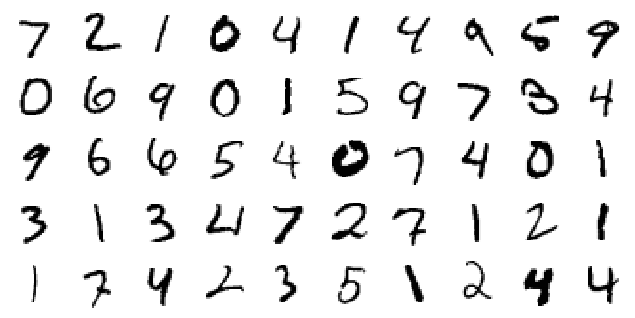

Encoded


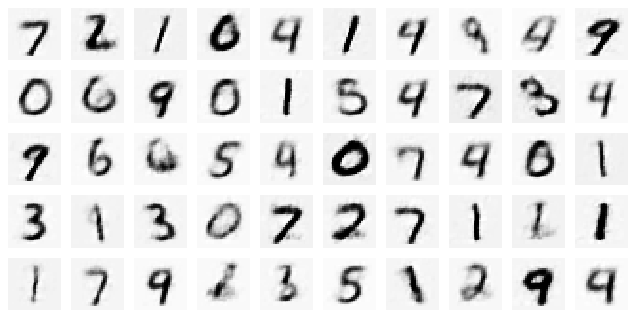

Generated


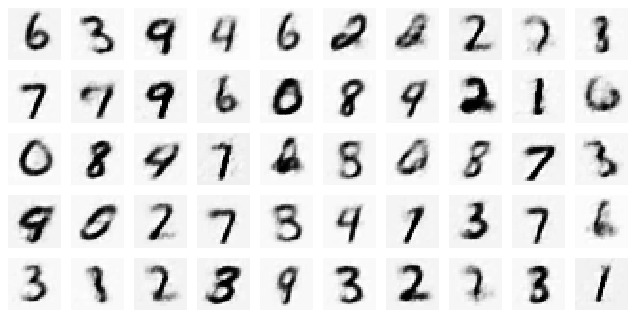

Test losses. G: 0.2048, D: 0.6874
Distribution error weight: 0.30465036630630493
Train Epoch: 60 [0/50000 (0%)]	Losses G: 0.1947, D: 0.6903
Train Epoch: 60 [25000/50000 (50%)]	Losses G: 0.2012, D: 0.6893
Original:


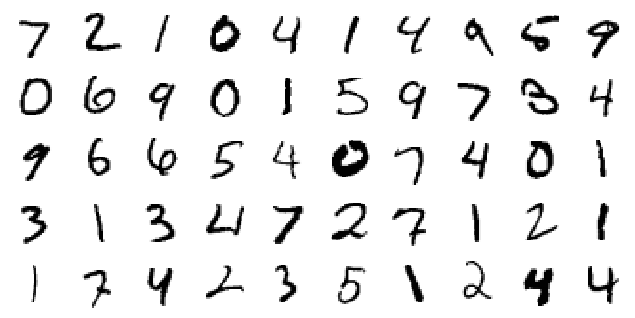

Encoded


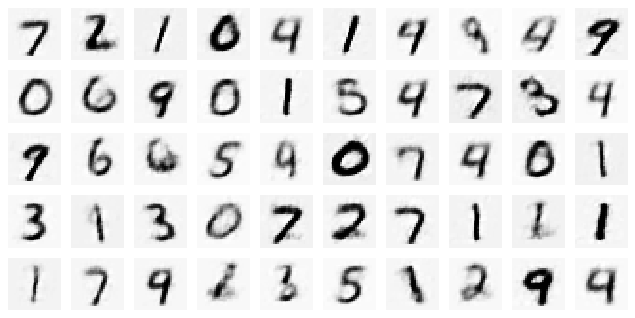

Generated


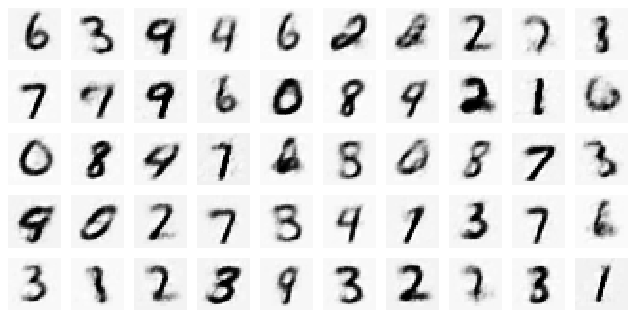

Test losses. G: 0.2044, D: 0.6856
Distribution error weight: 0.30634382367134094
Train Epoch: 61 [0/50000 (0%)]	Losses G: 0.1962, D: 0.6927
Train Epoch: 61 [25000/50000 (50%)]	Losses G: 0.1928, D: 0.6926
Original:


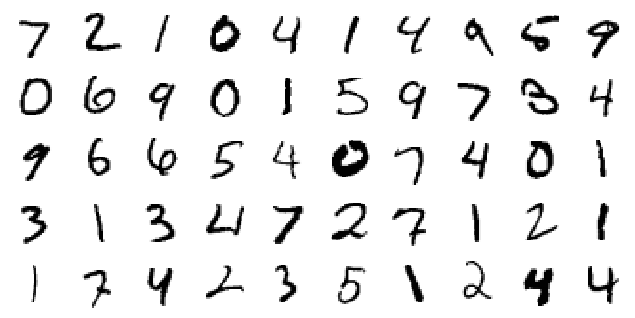

Encoded


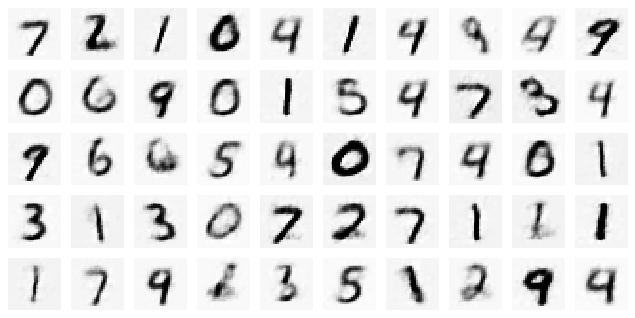

Generated


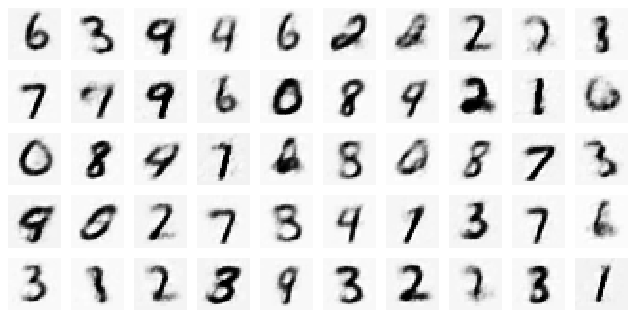

Test losses. G: 0.2031, D: 0.6864
Distribution error weight: 0.30851900577545166
Train Epoch: 62 [0/50000 (0%)]	Losses G: 0.1963, D: 0.6827
Train Epoch: 62 [25000/50000 (50%)]	Losses G: 0.2025, D: 0.6830
Original:


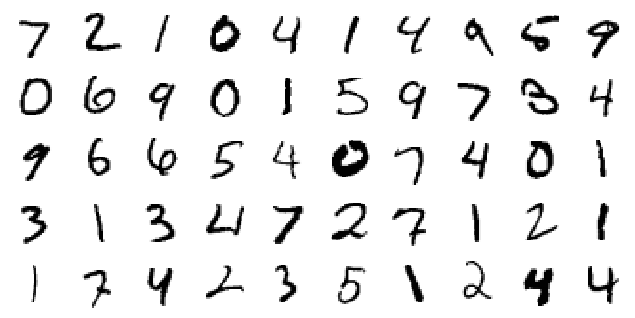

Encoded


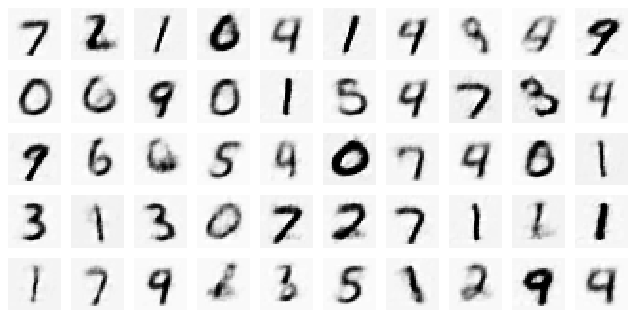

Generated


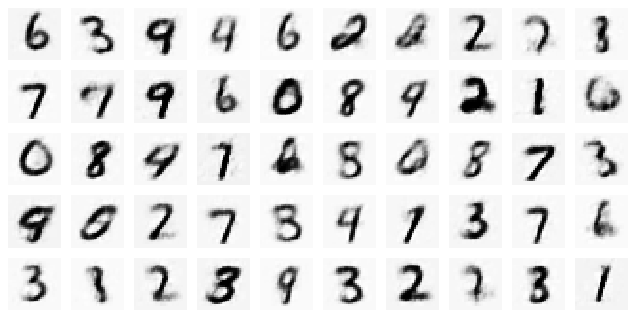

Test losses. G: 0.2022, D: 0.6867
Distribution error weight: 0.3093571960926056
Train Epoch: 63 [0/50000 (0%)]	Losses G: 0.1916, D: 0.6862
Train Epoch: 63 [25000/50000 (50%)]	Losses G: 0.1968, D: 0.6838
Original:


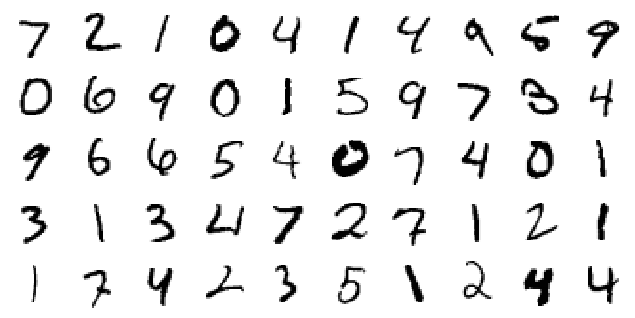

Encoded


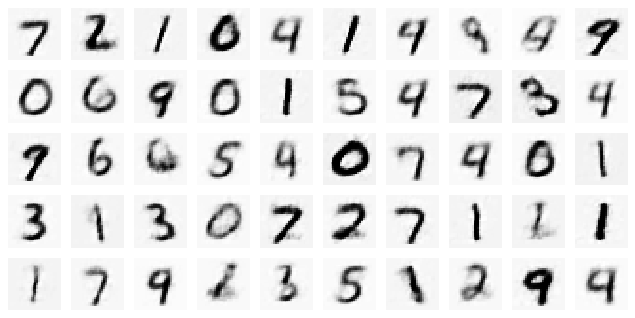

Generated


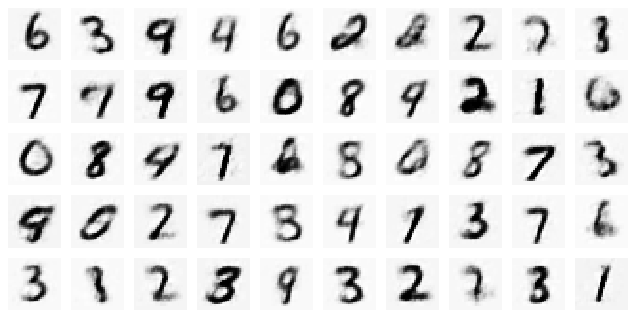

Test losses. G: 0.2017, D: 0.6859
Distribution error weight: 0.31185296177864075
Train Epoch: 64 [0/50000 (0%)]	Losses G: 0.1882, D: 0.6810
Train Epoch: 64 [25000/50000 (50%)]	Losses G: 0.1973, D: 0.6820
Original:


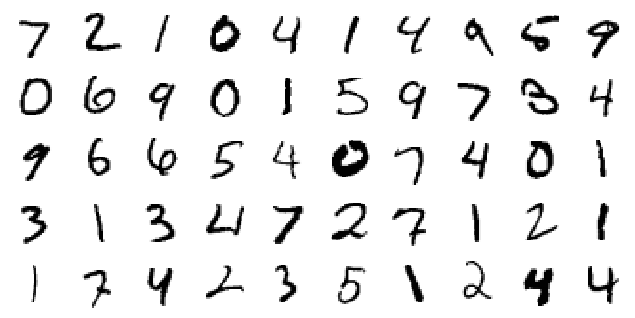

Encoded


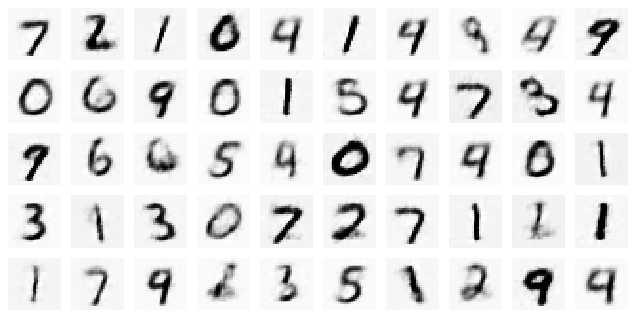

Generated


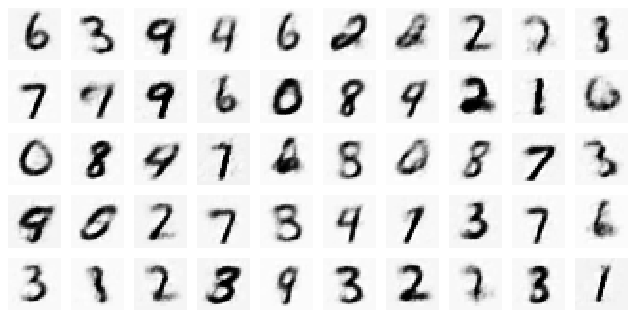

Test losses. G: 0.2009, D: 0.6867
Distribution error weight: 0.31330636143684387
Train Epoch: 65 [0/50000 (0%)]	Losses G: 0.1896, D: 0.6857
Train Epoch: 65 [25000/50000 (50%)]	Losses G: 0.1916, D: 0.6897
Original:


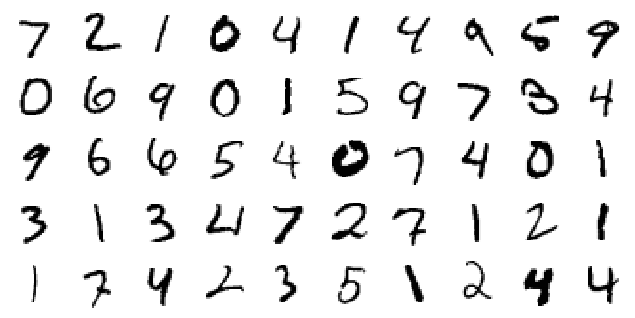

Encoded


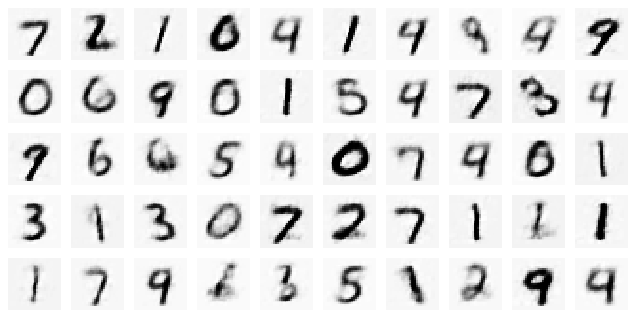

Generated


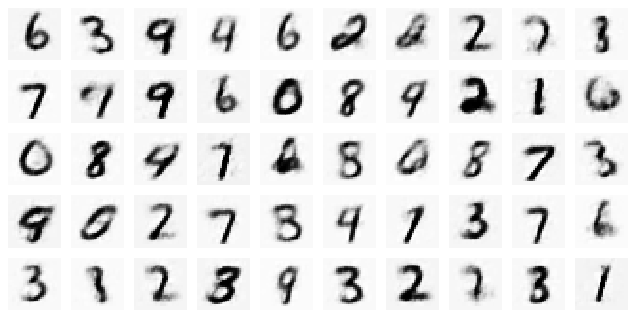

Test losses. G: 0.2000, D: 0.6860
Distribution error weight: 0.31399813294410706
Train Epoch: 66 [0/50000 (0%)]	Losses G: 0.1879, D: 0.6871
Train Epoch: 66 [25000/50000 (50%)]	Losses G: 0.1932, D: 0.6930
Original:


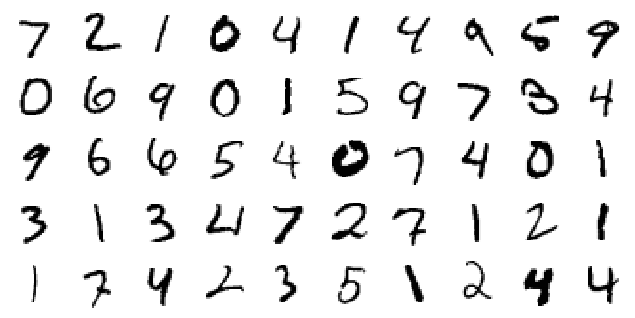

Encoded


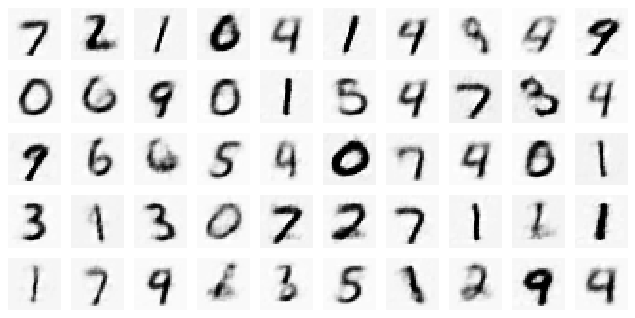

Generated


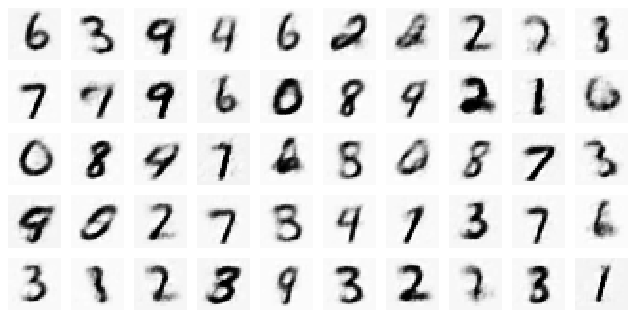

Test losses. G: 0.1996, D: 0.6849
Distribution error weight: 0.3156469464302063
Train Epoch: 67 [0/50000 (0%)]	Losses G: 0.1924, D: 0.6896
Train Epoch: 67 [25000/50000 (50%)]	Losses G: 0.1972, D: 0.6849
Original:


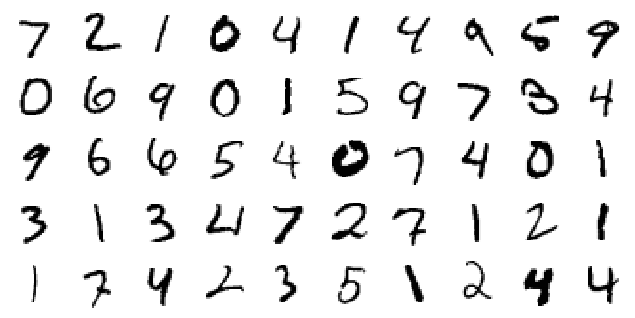

Encoded


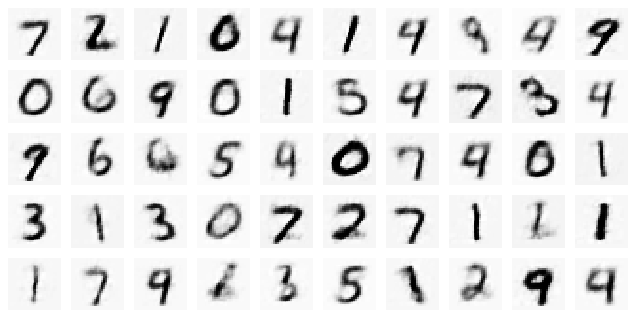

Generated


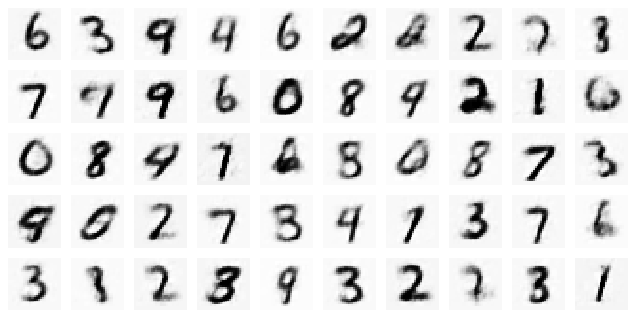

Test losses. G: 0.1986, D: 0.6862
Distribution error weight: 0.3160393238067627
Train Epoch: 68 [0/50000 (0%)]	Losses G: 0.1936, D: 0.6966
Train Epoch: 68 [25000/50000 (50%)]	Losses G: 0.1932, D: 0.6845
Original:


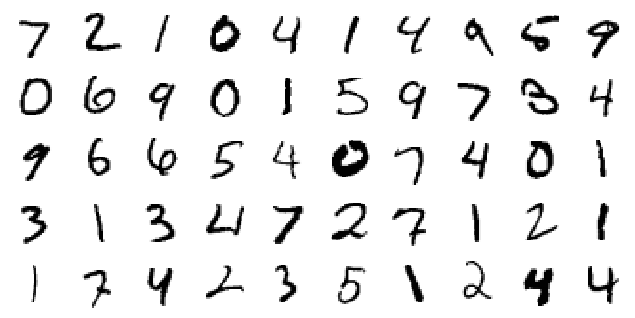

Encoded


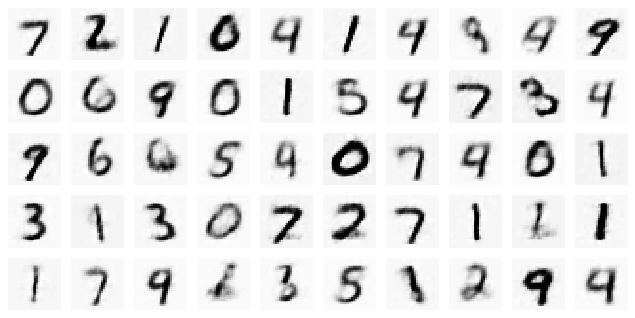

Generated


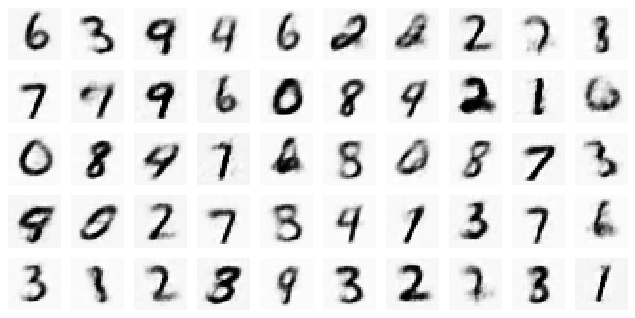

Test losses. G: 0.1978, D: 0.6858
Distribution error weight: 0.31745409965515137
Train Epoch: 69 [0/50000 (0%)]	Losses G: 0.1866, D: 0.6903
Train Epoch: 69 [25000/50000 (50%)]	Losses G: 0.1916, D: 0.6931
Original:


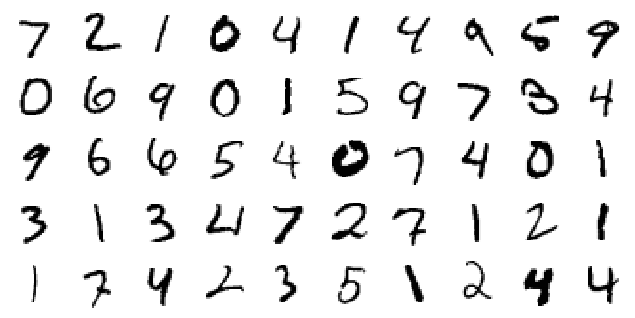

Encoded


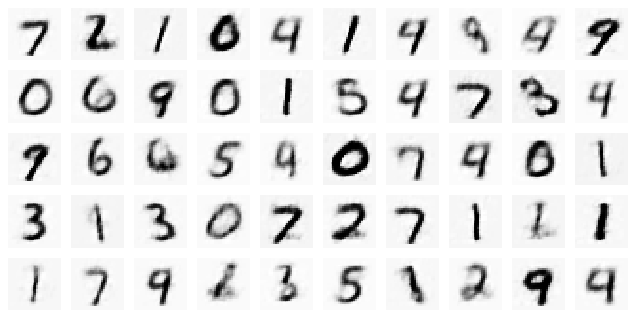

Generated


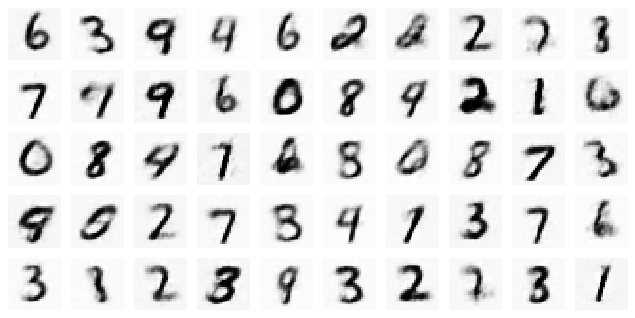

Test losses. G: 0.1977, D: 0.6875
Distribution error weight: 0.3189220130443573
Train Epoch: 70 [0/50000 (0%)]	Losses G: 0.1910, D: 0.6868
Train Epoch: 70 [25000/50000 (50%)]	Losses G: 0.1925, D: 0.6836
Original:


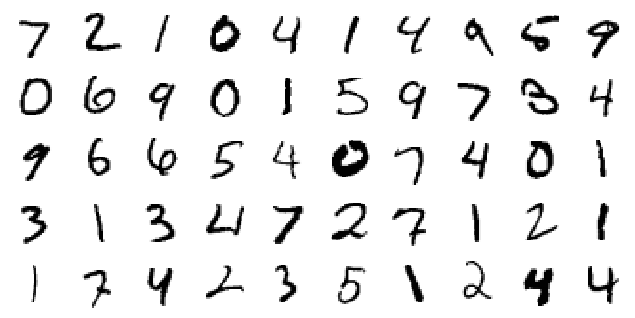

Encoded


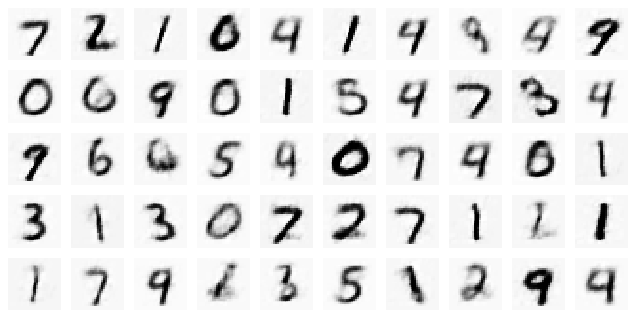

Generated


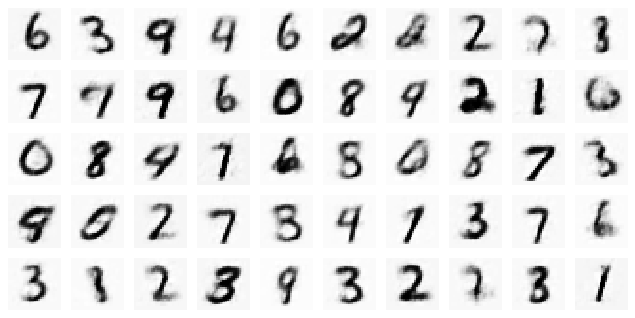

Test losses. G: 0.1968, D: 0.6851
Distribution error weight: 0.31954702734947205
Train Epoch: 71 [0/50000 (0%)]	Losses G: 0.1871, D: 0.6916
Train Epoch: 71 [25000/50000 (50%)]	Losses G: 0.1907, D: 0.6878
Original:


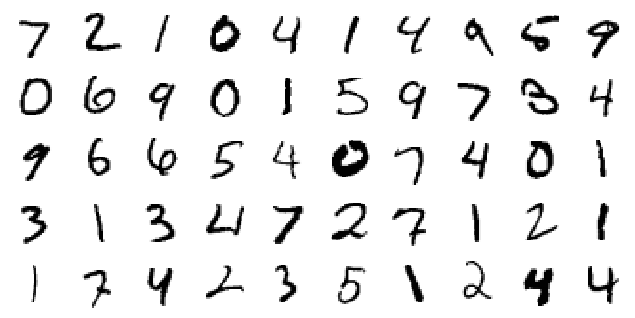

Encoded


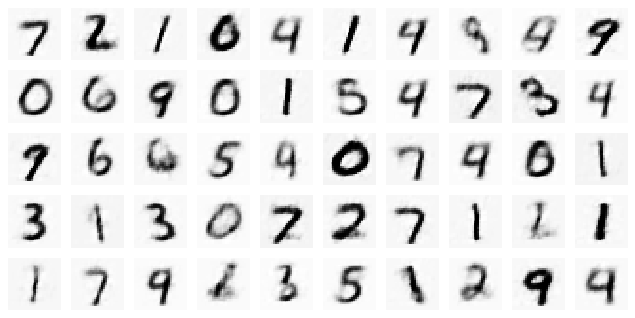

Generated


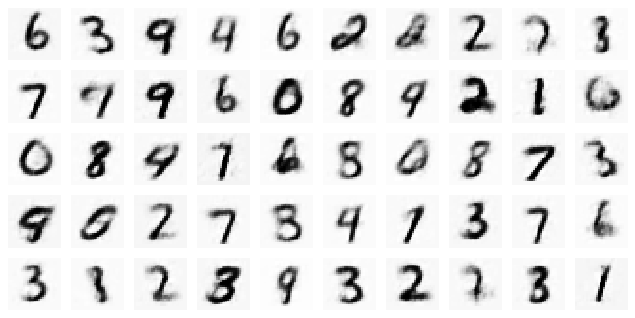

Test losses. G: 0.1964, D: 0.6853
Distribution error weight: 0.3213062584400177
Train Epoch: 72 [0/50000 (0%)]	Losses G: 0.1903, D: 0.6922
Train Epoch: 72 [25000/50000 (50%)]	Losses G: 0.1929, D: 0.6902
Original:


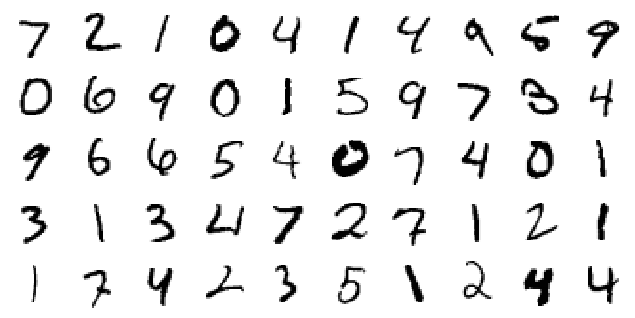

Encoded


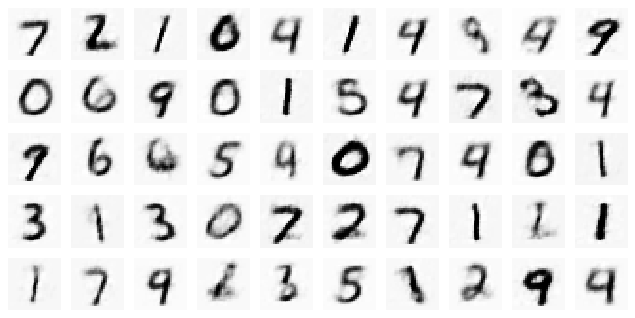

Generated


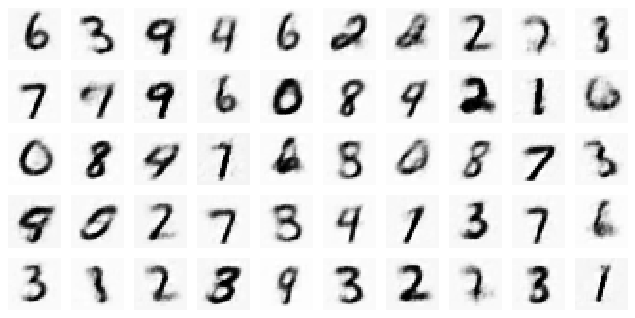

Test losses. G: 0.1953, D: 0.6865
Distribution error weight: 0.3209329843521118
Train Epoch: 73 [0/50000 (0%)]	Losses G: 0.1872, D: 0.6900
Train Epoch: 73 [25000/50000 (50%)]	Losses G: 0.1921, D: 0.6925
Original:


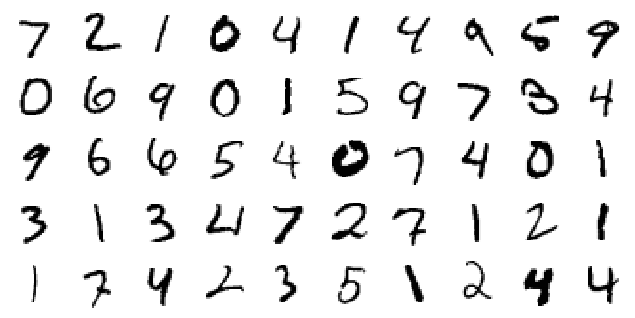

Encoded


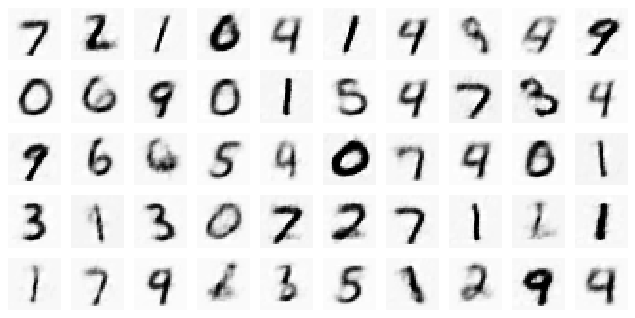

Generated


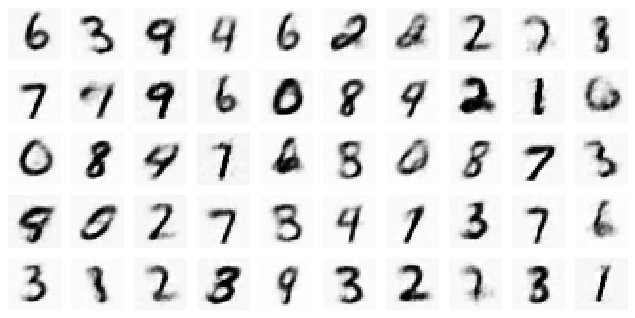

Test losses. G: 0.1957, D: 0.6843
Distribution error weight: 0.32429543137550354
Train Epoch: 74 [0/50000 (0%)]	Losses G: 0.1887, D: 0.6849
Train Epoch: 74 [25000/50000 (50%)]	Losses G: 0.1846, D: 0.6889


In [0]:
for epoch in range(1, 200):
  train(epoch, model)
  test(model, D, test_loader, epoch)
#     for model in models.values():
#         model.train()
#     train(epoch, models, train_log)
#     for model in models.values():
#         model.eval()
#     test(models, valid_loader, epoch, test_log)

In [0]:
x = np.linspace(-3, 3, 10)
y = np.linspace(-3, 3, 10)
xv, yv = np.meshgrid(x, y)
NPA = np.hstack([xv.reshape([1,-1]).T, yv.reshape([1,-1]).T])
r = torch.FloatTensor(NPA)
with torch.no_grad():
  fixed_gen = model.decode(r.to(device)).data.cpu().numpy()
  plot_mnist(fixed_gen, (10, 10), True, fixed_folder + '/%s_%03d.png' % (0, epoch))